# "Customer Churn using Survival Analysis"

> Find survival probability of a customer using the lifelines package
- toc: true
- branch: master
- badges: false
- comments: true
- hide: false
- search_exclude: true
- metadata_key1: metadata_value1
- metadata_key2: metadata_value2
- image: images/SurvivalAnalysis_lifelines.png
- categories: [Marketing_Industry,  Survival_Analysis,Customer_Churn,  lifelines]
- show_tags: true

In [115]:
# hide
# informed by:
#1 https://github.com/CamDavidsonPilon/lifelines/blob/master/examples/Customer%20Churn.ipynb
#2 https://github.com/zangell44/survival-analysis-lifeline-basics/blob/master/customer_churn.ipynb
#3 https://towardsdatascience.com/end-to-end-machine-learning-project-telco-customer-churn-90744a8df97d
#4 https://colab.research.google.com/github/michellebonat/Predict_Customer_Churn_ML/blob/master/Predict_Customer_Churn_Case_Study.ipynb#scrollTo=uZh4954qnm0y
#5 https://www.kaggle.com/code/brunods10/predicting-customer-churn-with-survival-analysis/notebook
#6 https://www.thomasjpfan.com/2018/09/survival-regression-analysis-on-customer-churn/
    #very nice graphics
    #optimum expected lifetime value as a function of Monthly Rate
    #do not use get_dummies
#7 https://towardsdatascience.com/are-you-answering-the-right-churn-questions-ed146c34b336
    #extensive NON-SA approaches too
    #outlines why classification is not ideal

## 1 Business Understanding

*Customer churn* is a term that refers to the event that an existing customer (or client) of a company decides to separate from the company. This could mean that the customer switches to buying from a competitor, or simply, that the customer stops doing business with the company.

### 1.1 Modeling customer churn

It is important for digitally enabled companies to track customer churn. To model this aspect of customer behavior the first approach that comes to mind is supervised learning. A dataset will contain some features of customers and a target variable: Whether a customer has churned or not. A classification model could be helpful to identify customers that might churn some or other time. But will this be useful? Eventually, *all* customers will churn at some future time. What might be much more useful is to predict the *lifetime* of a customer, in other words, how long a customer will stay engaged with the company.

When predicting the lifetime of a customer, we change from a classification to a regression model as we need to predict a numerical value (lifetime). This regression approach, however, has a serious drawback. Most customers will not have churned, at a specific point in time. This means for all these datapoints we do not have a target value. We can choose to eliminate these datapoints from the dataset, but they represent the larger part of it! In addition, the fact that all these customers are still engaged with the company represent valuable information. It will be beneficial to have a method that can handle this complication. Such a method is that of *Survival Analysis*.

Survival analysis focuses on a unique kind of outcome variable: the *time until an event occurs*. In our present situation this event is the 'death' or churn of a customer. This will allow us to predict the time until a specific customer churns. For all customers in the dataset who are still active, we simply do not know when they will churn, and we simply flag their time-to-churn as *censored*. A customer record may also be censored in other cases, e.g. when a customer's data are lost, or when a customer engaged with the company earlier than the date range of the dataset.

### 1.2 Survival and Censoring Times

We assume that for each customer, there is a 

* **Survival time**, $T$

This is the time at which the event of interest occurs. Survival time is also referred to as *event time* or *failure time*. In our present case this refers to the duration from engagement with the company until the cancellation of subscription, say (i.e. churn.

* **Censoring time** $C$

This is time at which censoring occurs. This could be the time at which the last assessment of the cusomer is undertaken, or the time at which the dataset is compiled (given the customer is still engaged).


In our dataset, we will have two outcome variables:

* **Duration** $Y$

We observe a duration which could be either a survival time $T$, or else a censoring time $C$. In fact, we observe the random variable $Y = min(T, C)$. If $T<C$ we observe the survival time $T$. Alternatively, if $T>C$ we observe the censoring time $C$.

* **Event/Status indicator** $\delta$

In addition to observing a duration, we also observe a status or event indicator,

$$ \delta = 
\begin{cases}
1 \text{  if  } T \leq C\\
0 \text{  if  } T > C
\end{cases} $$

When we observe a *survival time* $\delta=1$, and if we instead observe a *censoring time* $\delta=0$.

* **Dataset**

The dataset consists of a set of datapoints $(x_1, y_1, \delta_1), ..., (x_i, y_i, \delta_i), ..., (x_n, y_n, \delta_n)$ where

* $x_i$ is the feature vector
* $y_i$ is the duration, either a survival time or a censoring time
* $\delta_i$ is the status/event indicator

This means we actually have two outcome variables: $y$ and $\delta$. The $x$'s are the usual predictor points.

### 1.3 Other survival analysis terminology

* **Usual statistical functions**

The survival time $T$ is a random variable and the usual statistical properties apply. First there is the *cumulative distribution function* (cdf) of $T$:

$F(t) = Pr\{T \leq t\}$

Next, there is the probability density function (pdf) of $T$:

$f(t)$

which is also known as the event density function, i.e. the rate of events per unit time.

The usual relationships exist between $F(t)$ and $f(t)$:

$F(t) = \int_{-\infty}^{t}f(u)du$

$f(t) = \frac{dF(t)}{dt}$

* **Survival function/probability**

$S(t) = Pr\{T > t\}$

Survival probability in $t$ is the probability that the survival time, $T$ exceeds $t$, i.e. the probability to survive beyond $t$.

Note that

$1 - F(t) = S(t)$, and

$f(t) = -\frac{dS(t)}{dt}$

* **Survival function estimate**

When we estimate the survival probability with numerical techniques, we usually refer to the survival function estimate

$\hat{S}(t)$

* **Hazard function**

The *hazard function* expresses the conditional probability that the event will occur within $t, t+dt$, given that it has not occurred before

$h(t) = \lim_{\Delta t \to 0} \frac{Pr\{t < T \leq t+\Delta t | T > t \}}{\Delta t} = \frac{f(t)}{S(t)} = -\frac{d}{dt}S(t)$

$h(t)$ is the event rate in the instant after time $t$, given survival past that time.

* **Cumulative hazard function**

$H(t) = \int_{0}^{t}h(u)du$

* **Some relationships**

$S(t) = \text{exp}[-\int_{0}^{t}h(u)du]$

$S(t) = \text{exp}[-H(t)]$

$h(t) = -[\frac{\frac{dS(t)}{dt}}{S(t)}]$

### 1.4 The goal of survival analysis

The goal of survival analysis may be simply stated as to:

Estimate the time to the event of interest, $T_j$ (survival time), for a new instance $j$ with feature predictors denoted by $X_j$.

## 2 Data Understanding

In [116]:
!pip install lifelines

In [117]:
import warnings
warnings.filterwarnings('ignore') #6
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from matplotlib import pyplot as plt
import seaborn as sns #7
import pandas as pd
pd.set_option('display.max_columns', None)
import lifelines

In [118]:
print('pandas:', pd.__version__)
print('lifelines:', lifelines.__version__)

pandas: 1.3.5
lifelines: 0.27.0


Pointers related to the dataset:

https://github.com/treselle-systems/customer_churn_analysis
https://www.kaggle.com/datasets/blastchar/telco-customer-churn

Other customer churn datasets:

https://community.ibm.com/community/user/businessanalytics/blogs/steven-macko/2019/07/11/telco-customer-churn-1113


In [119]:
df = pd.read_csv('https://raw.githubusercontent.com/'
                         'treselle-systems/customer_churn_analysis/'
                         'master/WA_Fn-UseC_-Telco-Customer-Churn.csv')
# df.head(10)
df

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes


In [120]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [121]:
# 
# need to fix TotalCharges for better understanding of this feature
df[df['TotalCharges']==' ']

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,No,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,Yes,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,Yes,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,No


In [122]:
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')
df

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.50,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.90,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.60,Yes


In [123]:
df['TotalCharges'].isnull().sum()

11

In [124]:
df_desc = df.describe(include="all").T
df_desc

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
customerID,7043,7043,7590-VHVEG,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gender,7043,2,Male,3555,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SeniorCitizen,7043.0,NaN,NaN,NaN,0.162147,0.368612,0.0,0.0,0.0,0.0,1.0
Partner,7043,2,No,3641,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependents,7043,2,No,4933,NaN,NaN,NaN,NaN,NaN,NaN,NaN
tenure,7043.0,NaN,NaN,NaN,32.371149,24.559481,0.0,9.0,29.0,55.0,72.0
PhoneService,7043,2,Yes,6361,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MultipleLines,7043,3,No,3390,NaN,NaN,NaN,NaN,NaN,NaN,NaN
InternetService,7043,3,Fiber optic,3096,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OnlineSecurity,7043,3,No,3498,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [125]:
df.nunique()

customerID          7043
gender                 2
SeniorCitizen          2
Partner                2
Dependents             2
tenure                73
PhoneService           2
MultipleLines          3
InternetService        3
OnlineSecurity         3
OnlineBackup           3
DeviceProtection       3
TechSupport            3
StreamingTV            3
StreamingMovies        3
Contract               3
PaperlessBilling       2
PaymentMethod          4
MonthlyCharges      1585
TotalCharges        6530
Churn                  2
dtype: int64

In [126]:
[print(f"{col}: {df[col].unique()}") for col in df]

customerID: ['7590-VHVEG' '5575-GNVDE' '3668-QPYBK' ... '4801-JZAZL' '8361-LTMKD'
 '3186-AJIEK']
gender: ['Female' 'Male']
SeniorCitizen: [0 1]
Partner: ['Yes' 'No']
Dependents: ['No' 'Yes']
tenure: [ 1 34  2 45  8 22 10 28 62 13 16 58 49 25 69 52 71 21 12 30 47 72 17 27
  5 46 11 70 63 43 15 60 18 66  9  3 31 50 64 56  7 42 35 48 29 65 38 68
 32 55 37 36 41  6  4 33 67 23 57 61 14 20 53 40 59 24 44 19 54 51 26  0
 39]
PhoneService: ['No' 'Yes']
MultipleLines: ['No phone service' 'No' 'Yes']
InternetService: ['DSL' 'Fiber optic' 'No']
OnlineSecurity: ['No' 'Yes' 'No internet service']
OnlineBackup: ['Yes' 'No' 'No internet service']
DeviceProtection: ['No' 'Yes' 'No internet service']
TechSupport: ['No' 'Yes' 'No internet service']
StreamingTV: ['No' 'Yes' 'No internet service']
StreamingMovies: ['No' 'Yes' 'No internet service']
Contract: ['Month-to-month' 'One year' 'Two year']
PaperlessBilling: ['Yes' 'No']
PaymentMethod: ['Electronic check' 'Mailed check' 'Bank transfer (automatic)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [127]:
# 
# check missing values
df.isnull().sum()

customerID           0
gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

### response variables

The role of response variables is played by 'tenure' for $y$ and 'Churn' for $\delta$.

In [128]:
plt.style.use('fivethirtyeight') #6
plt.rcParams['figure.figsize'] = [14, 8] #6
plt.rcParams['lines.linewidth'] = 2.5 #6

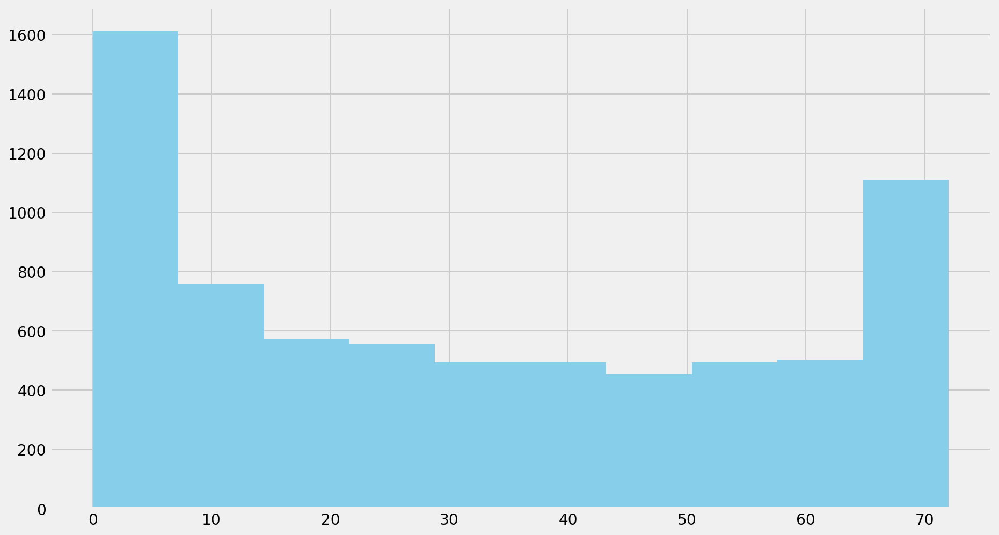

In [129]:
df['tenure'].hist(color='skyblue');

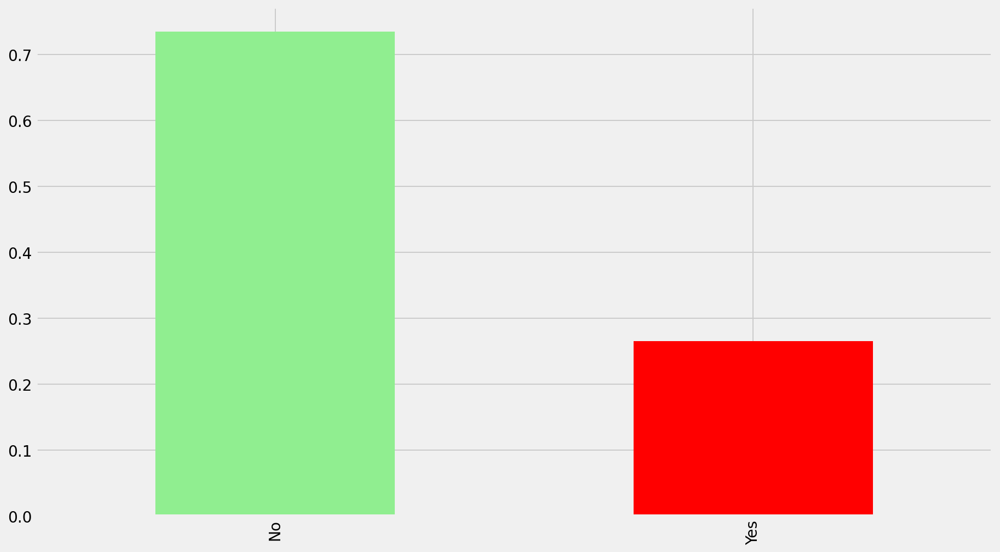

In [130]:
df['Churn'].value_counts(normalize=True).plot.bar(color=['lightgreen','red']);

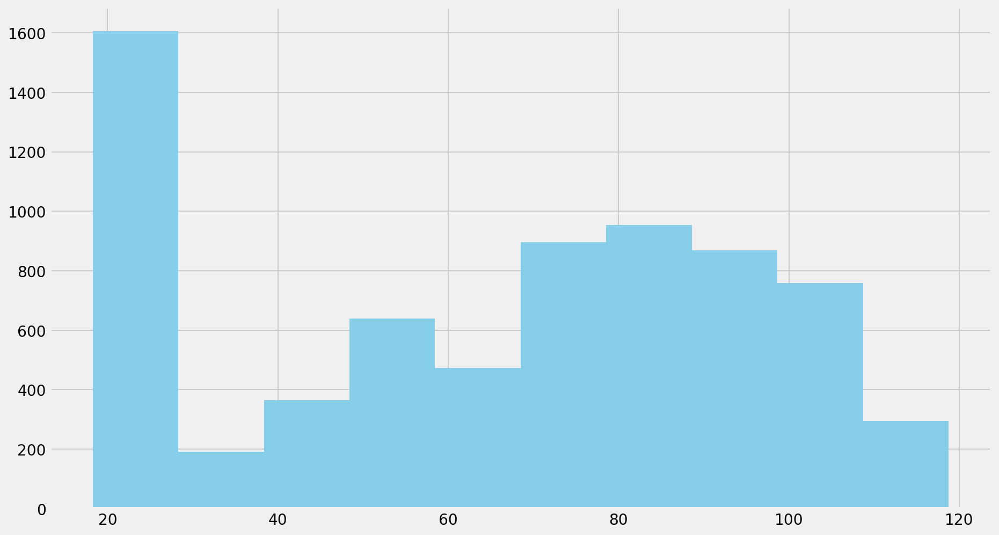

In [131]:
df['MonthlyCharges'].hist(color='skyblue');

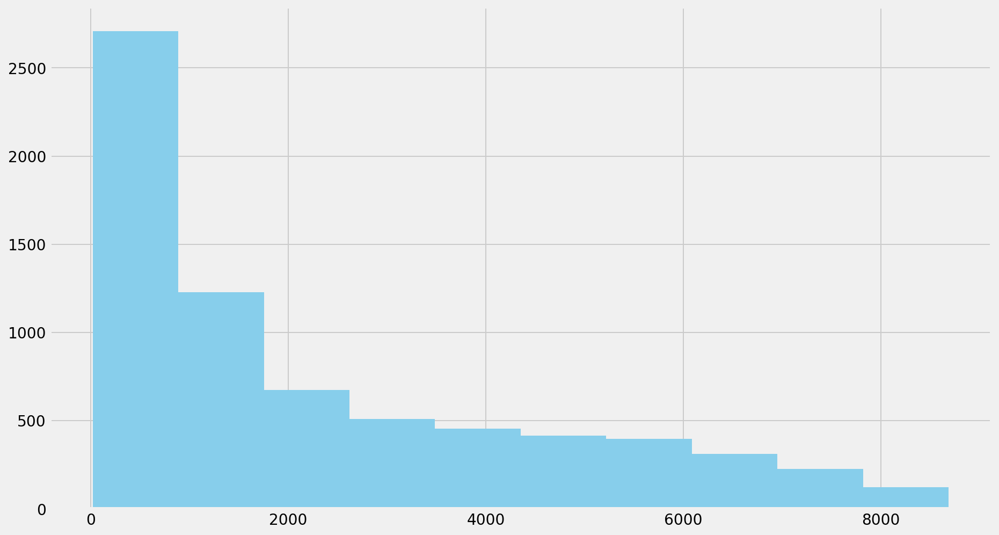

In [132]:
df['TotalCharges'].hist(color='skyblue');

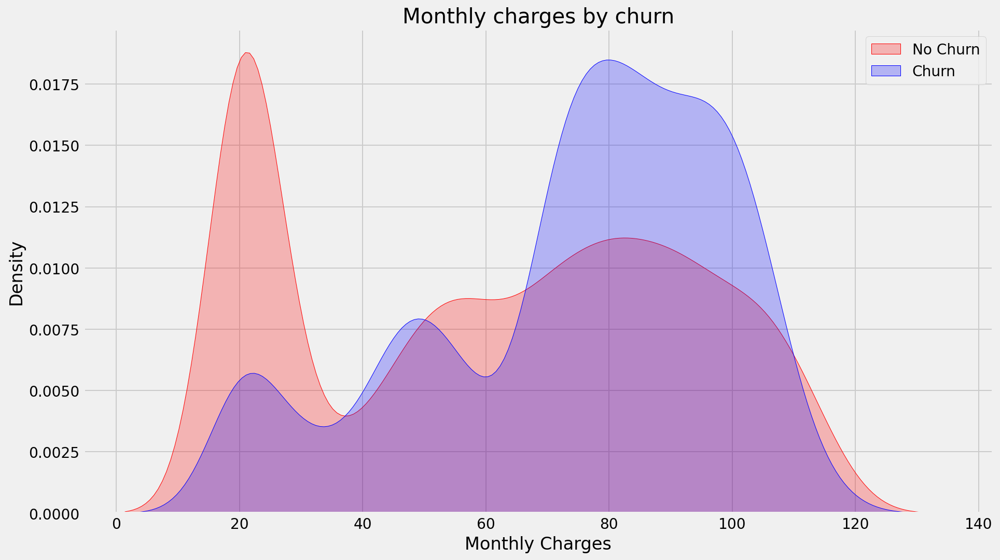

In [133]:
Mth = sns.kdeplot(df['MonthlyCharges'][(df["Churn"]=='No')],
                color="Red", shade = True)
Mth = sns.kdeplot(df['MonthlyCharges'][(df["Churn"]=='Yes')],
                ax=Mth, color="Blue", shade= True)
Mth.legend(["No Churn", "Churn"], loc='upper right')
Mth.set_ylabel('Density')
Mth.set_xlabel('Monthly Charges')
Mth.set_title('Monthly charges by churn');

In [134]:
mypal = [
    'lightblue',    
    'lightpink',
    'lightcyan',
    'lightgreen',
    'khaki',
    'gold',
    'wheat',
    'peachpuff',
    'mistyrose',
    'sandybrown',
    'violet',
]

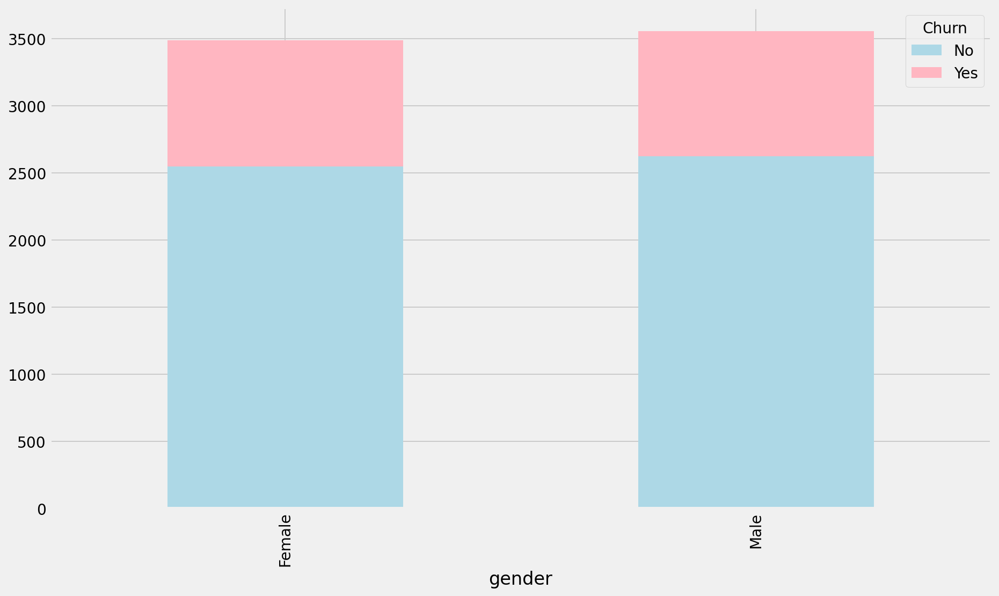

In [135]:
# df['gender'].value_counts(normalize=True).plot.bar(color=mypal);
pd.crosstab(df['gender'], df['Churn']).plot.bar(color=mypal, stacked=True);

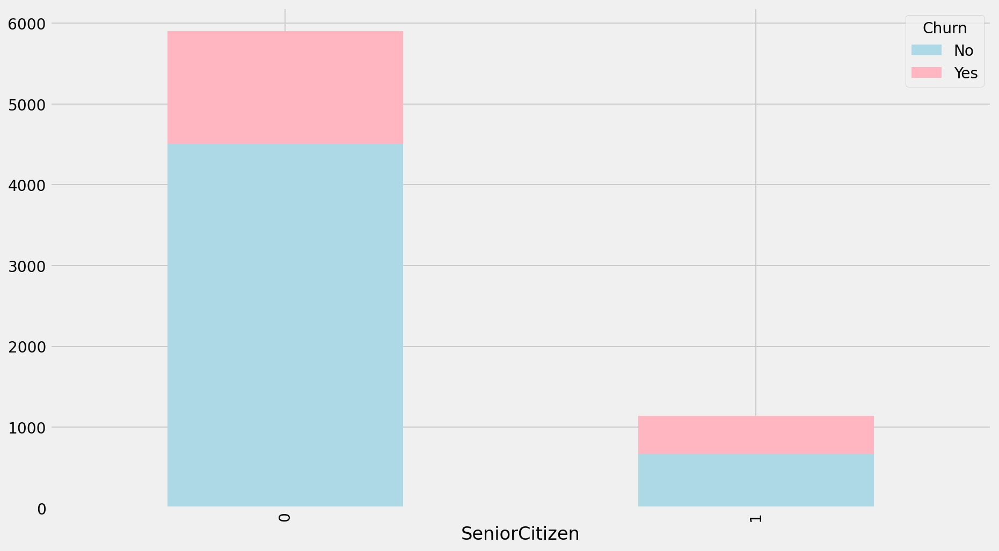

In [136]:
# df['SeniorCitizen'].value_counts(normalize=True).plot.bar(color=mypal);
pd.crosstab(df['SeniorCitizen'], df['Churn']).plot.bar(color=mypal, stacked=True);

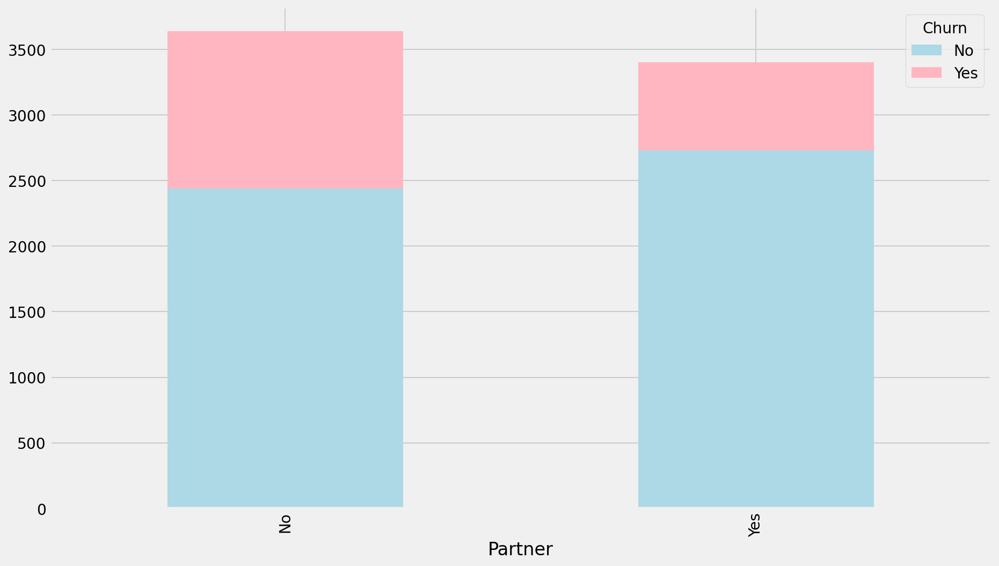

In [137]:
# df['Partner'].value_counts(normalize=True).plot.bar(color=mypal);
pd.crosstab(df['Partner'], df['Churn']).plot.bar(color=mypal, stacked=True);

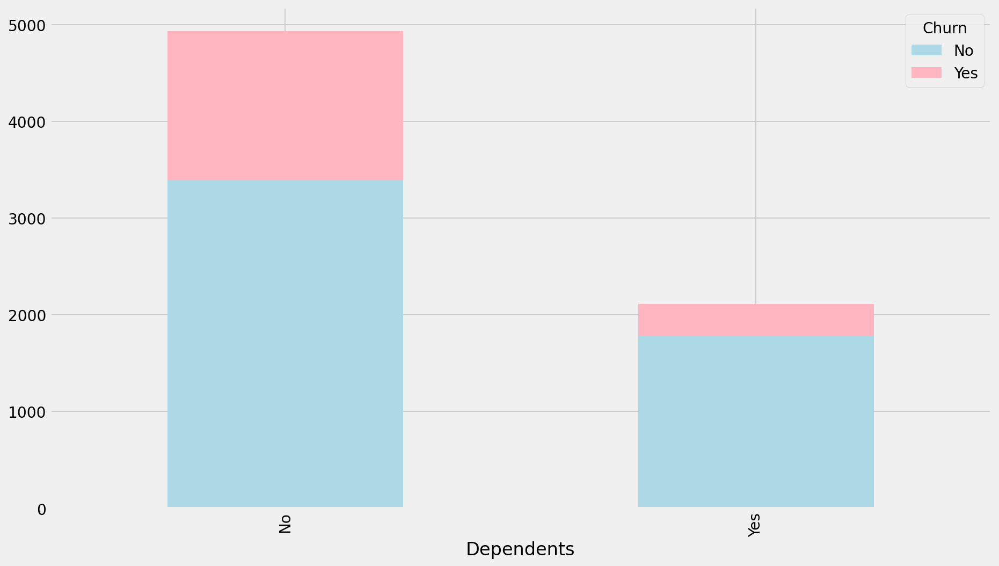

In [138]:
# df['Dependents'].value_counts(normalize=True).plot.bar(color=mypal);
pd.crosstab(df['Dependents'], df['Churn']).plot.bar(color=mypal, stacked=True);

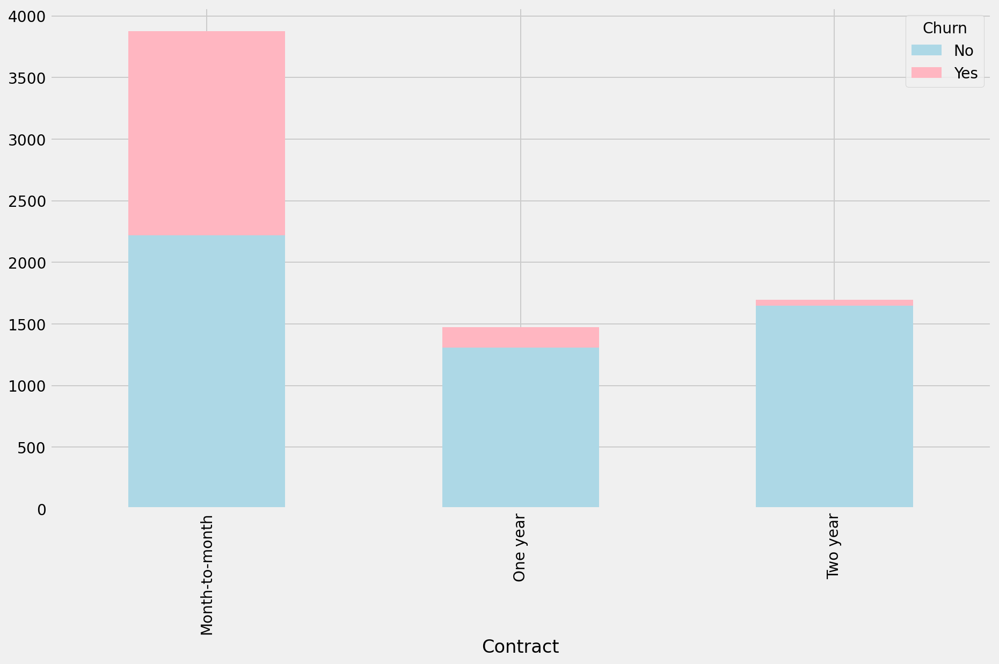

In [139]:
# df['Contract'].value_counts(normalize=True).plot.bar(color=mypal);
pd.crosstab(df['Contract'], df['Churn']).plot.bar(color=mypal, stacked=True);

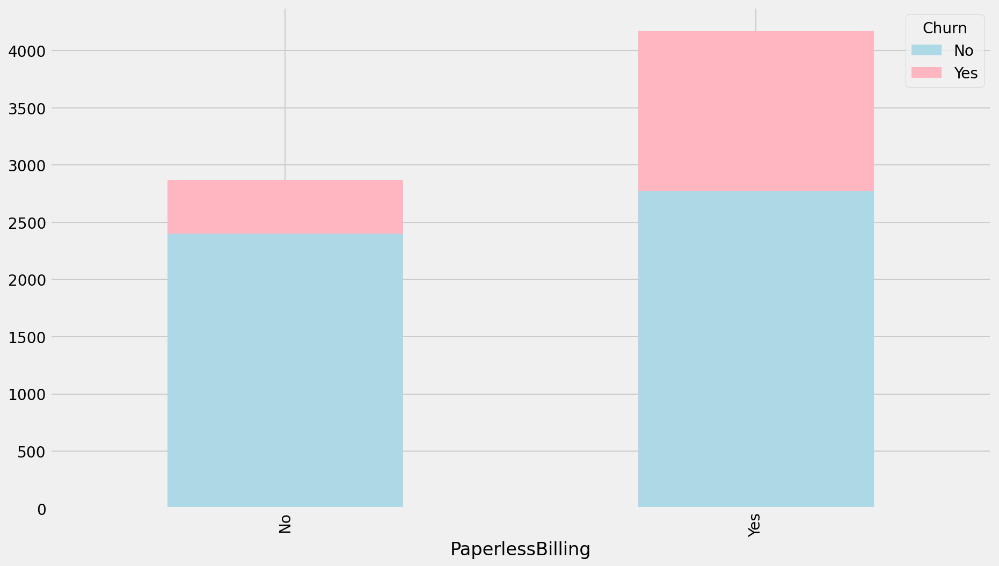

In [140]:
# df['PaperlessBilling'].value_counts(normalize=True).plot.bar(color=mypal);
pd.crosstab(df['PaperlessBilling'], df['Churn']).plot.bar(color=mypal, stacked=True);

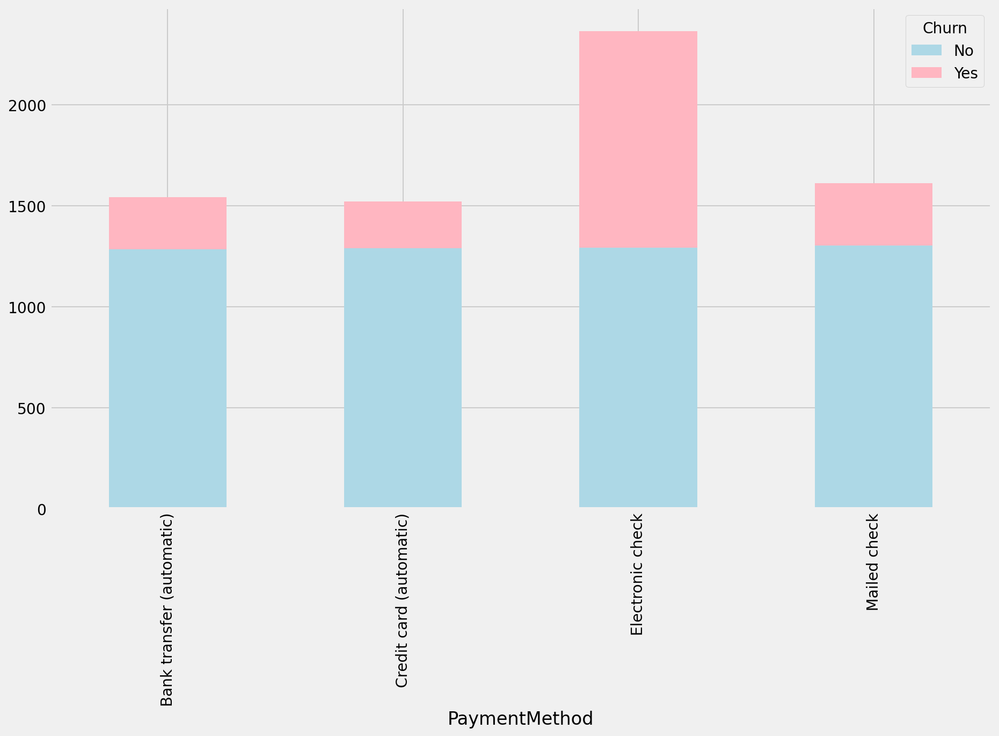

In [141]:
# df['PaymentMethod'].value_counts(normalize=True).plot.bar(color=mypal);
pd.crosstab(df['PaymentMethod'], df['Churn']).plot.bar(color=mypal, stacked=True);

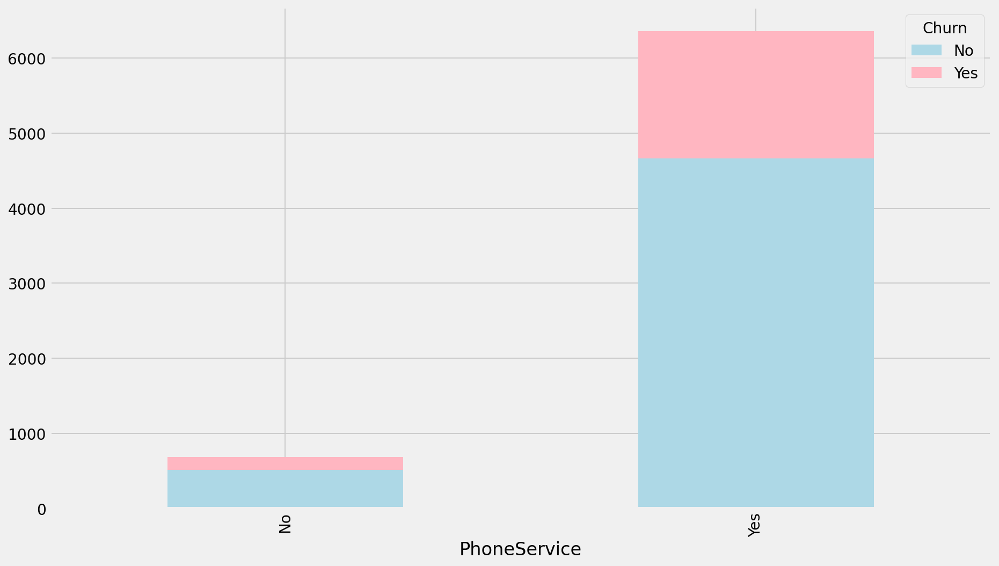

In [142]:
# df['PhoneService'].value_counts(normalize=True).plot.bar(color=mypal);
pd.crosstab(df['PhoneService'], df['Churn']).plot.bar(color=mypal, stacked=True);

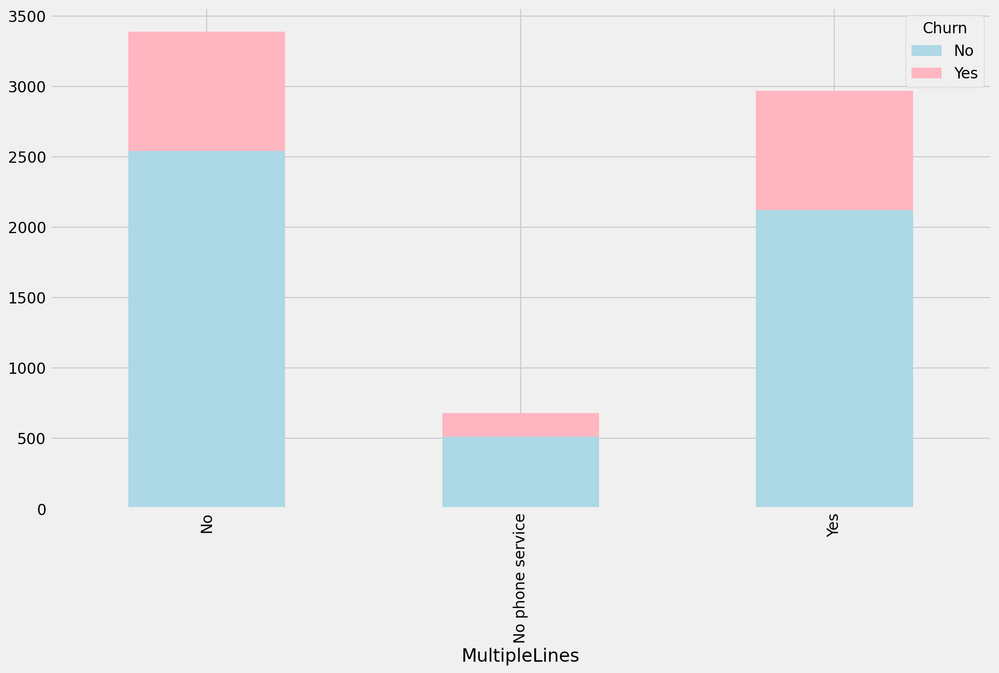

In [143]:
# df['MultipleLines'].value_counts(normalize=True).plot.bar(color=mypal);
pd.crosstab(df['MultipleLines'], df['Churn']).plot.bar(color=mypal, stacked=True);

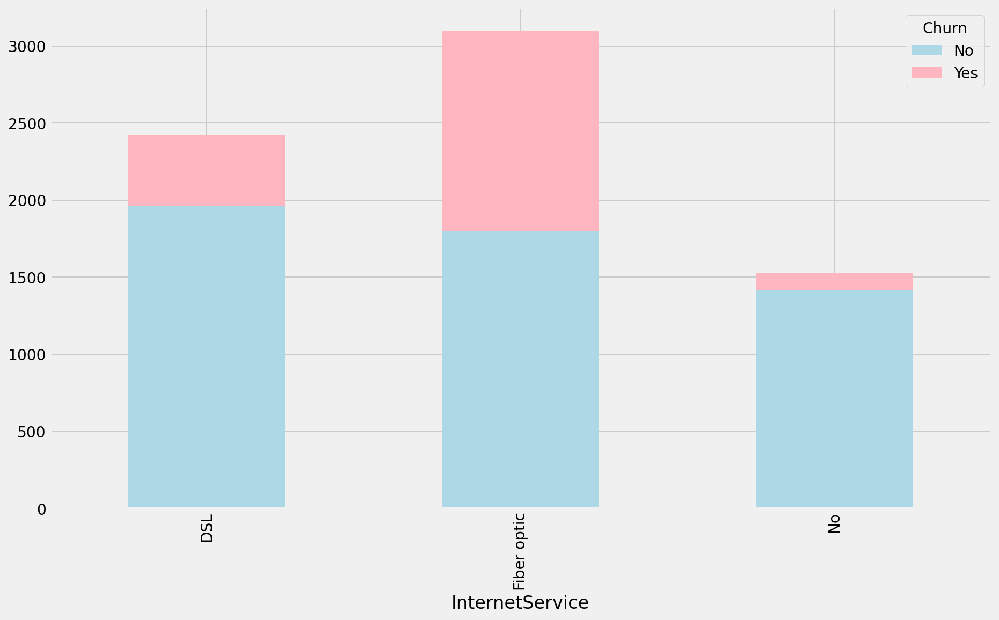

In [144]:
# df['InternetService'].value_counts(normalize=True).plot.bar(color=mypal);
pd.crosstab(df['InternetService'], df['Churn']).plot.bar(color=mypal, stacked=True);

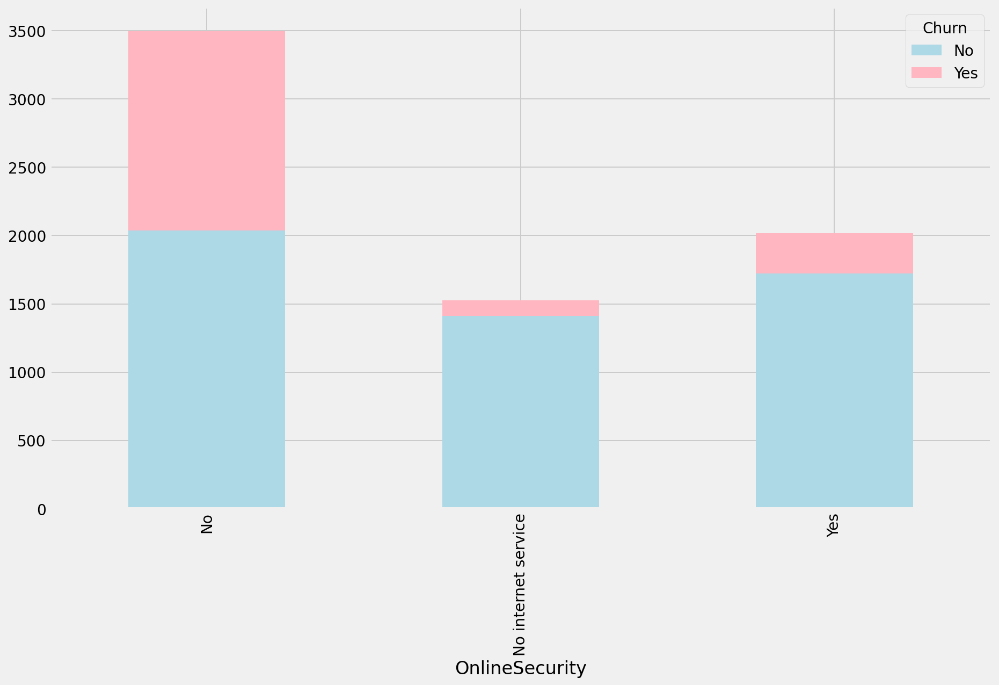

In [145]:
# df['OnlineSecurity'].value_counts(normalize=True).plot.bar(color=mypal);
pd.crosstab(df['OnlineSecurity'], df['Churn']).plot.bar(color=mypal, stacked=True);

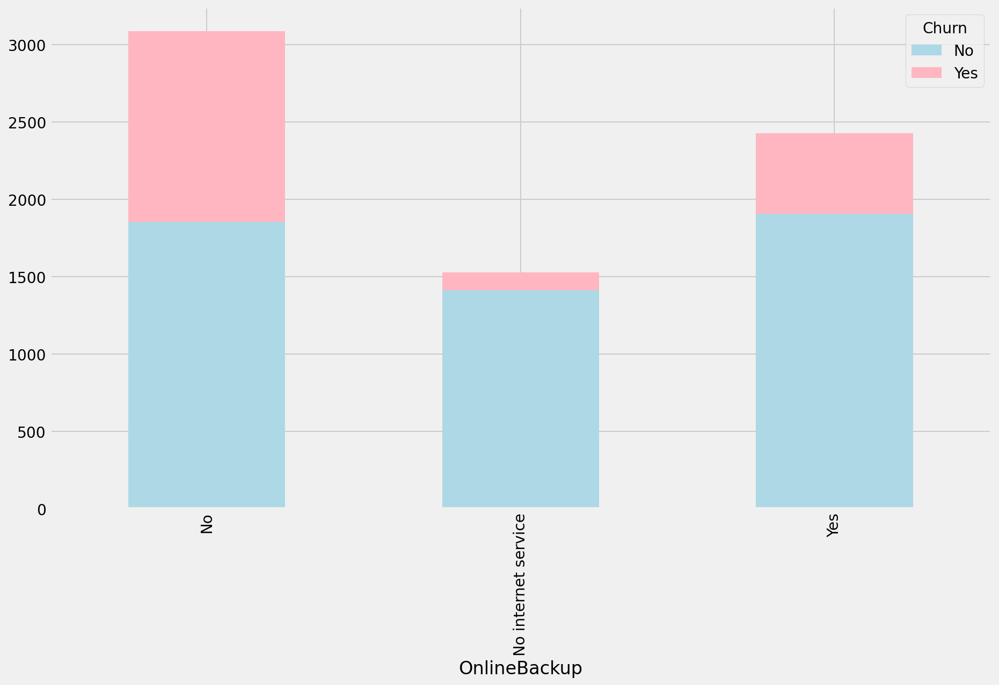

In [146]:
# df['OnlineBackup'].value_counts(normalize=True).plot.bar(color=mypal);
pd.crosstab(df['OnlineBackup'], df['Churn']).plot.bar(color=mypal, stacked=True);

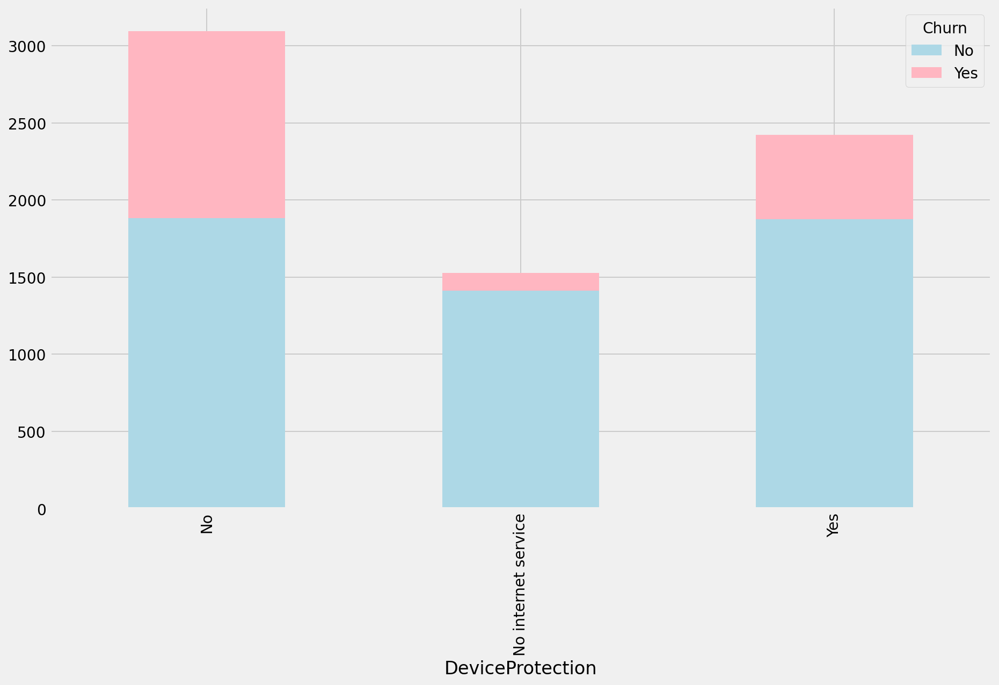

In [147]:
# df['DeviceProtection'].value_counts(normalize=True).plot.bar(color=mypal);
pd.crosstab(df['DeviceProtection'], df['Churn']).plot.bar(color=mypal, stacked=True);

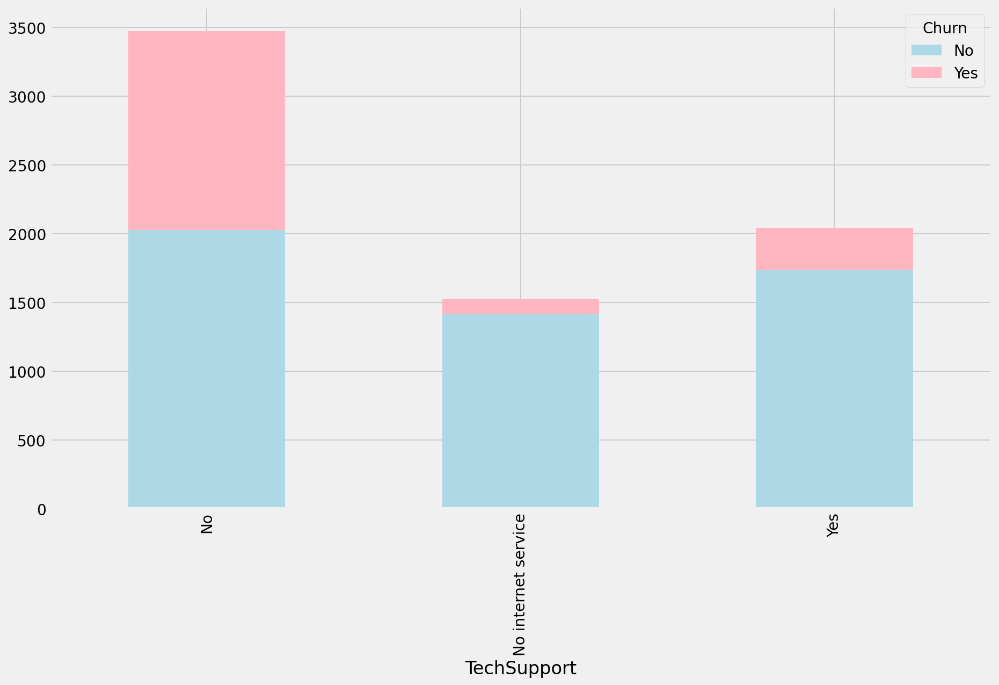

In [148]:
# df['TechSupport'].value_counts(normalize=True).plot.bar(color=mypal);
pd.crosstab(df['TechSupport'], df['Churn']).plot.bar(color=mypal, stacked=True);

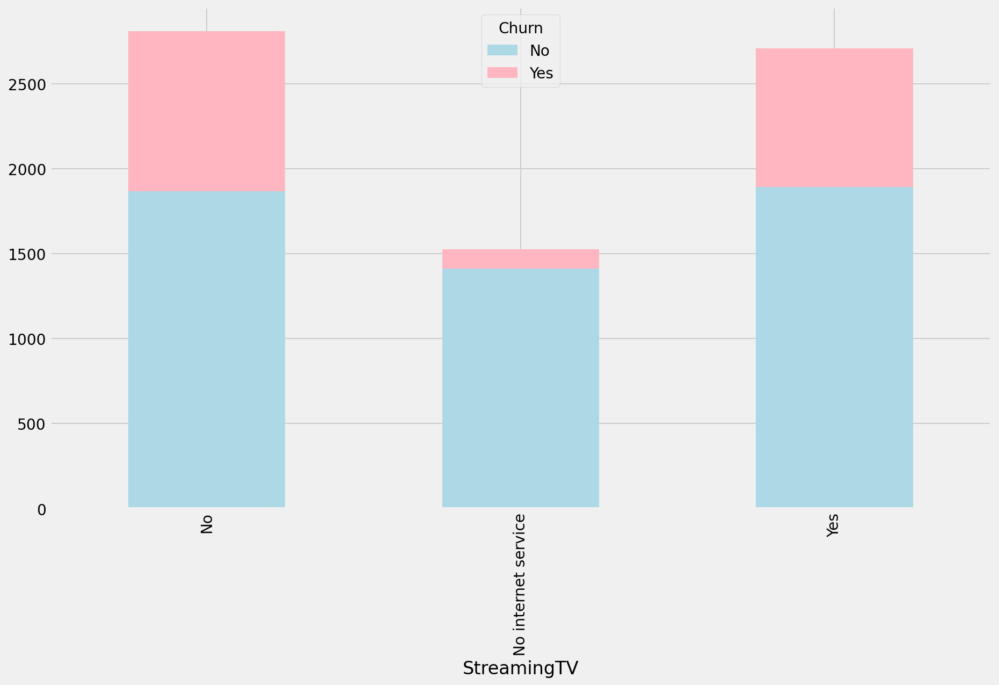

In [149]:
# df['StreamingTV'].value_counts(normalize=True).plot.bar(color=mypal);
pd.crosstab(df['StreamingTV'], df['Churn']).plot.bar(color=mypal, stacked=True);

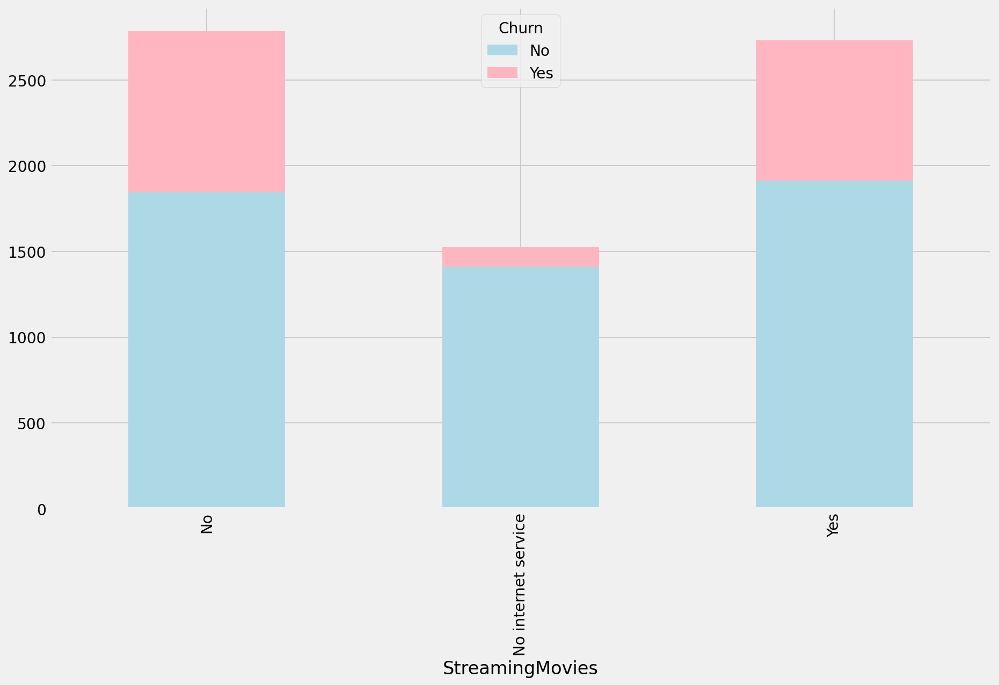

In [150]:
# df['StreamingMovies'].value_counts(normalize=True).plot.bar(color=mypal);
pd.crosstab(df['StreamingMovies'], df['Churn']).plot.bar(color=mypal, stacked=True);

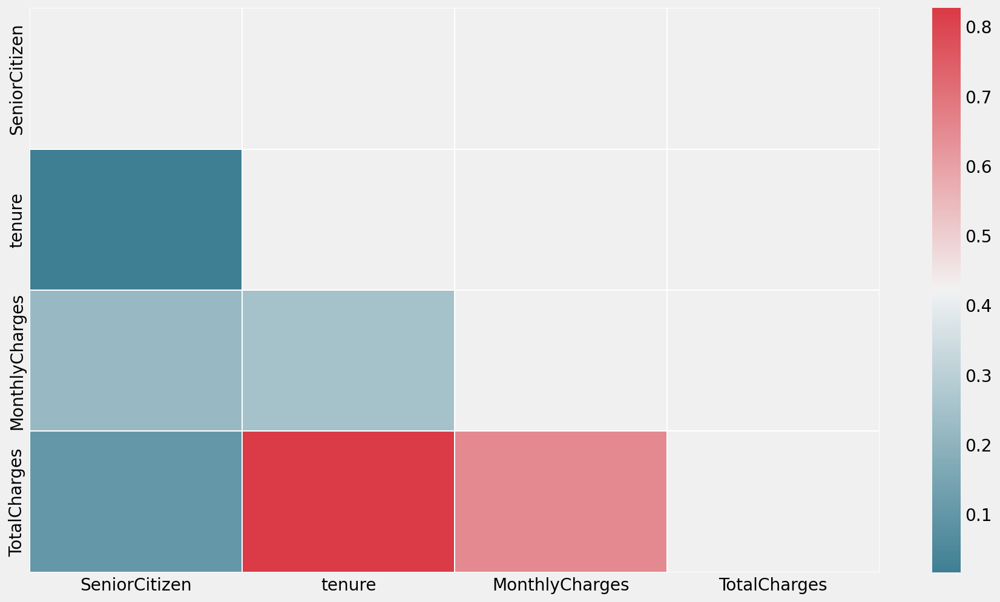

In [151]:
import numpy as np
# sns.heatmap(df.corr(), cmap="Paired")
# Generate a mask for the upper triangle #7
corr = df.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))
# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)
# Plot correlation matrix
sns.heatmap(corr, cmap=cmap, linewidths=.5, mask=mask);

In [152]:
# 
# inspect life times of a sample of customers
df_life = df[['tenure','Churn']]
df_life = df_life.replace({'Churn': {'No': False, 'Yes': True}})
df_life

,tenure,Churn
0,1,False
1,34,False
2,2,True
3,45,False
4,2,True
...,...,...
7038,24,False
7039,72,False
7040,11,False
7041,4,True


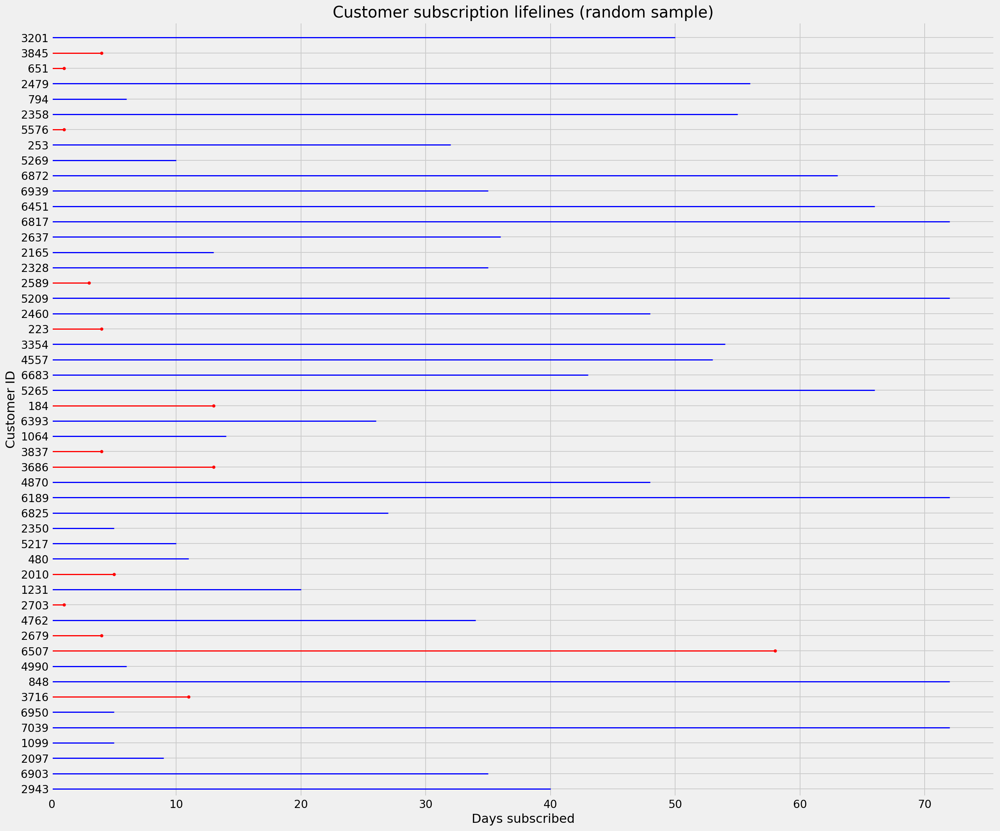

In [153]:
from lifelines.plotting import plot_lifetimes
n = 50
sample = df_life.sample(n, replace=False)
durations = sample['tenure']
status = sample['Churn']

plt.figure(figsize=(18, 15));
plot_lifetimes(
    durations=durations, event_observed=status,
    #entry=None,
    #left_truncated=False,
    sort_by_duration=False,
    event_observed_color='red', 
    event_censored_color='blue', 
)
plt.xlabel('Days subscribed', fontsize=16);
plt.ylabel('Customer ID', fontsize=16);
plt.title('Customer subscription lifelines (random sample)', fontsize=20)
plt.tight_layout()

## 3 Data Preparation

In [154]:
df['customerID'].duplicated().any()

False

In [155]:
df = df.set_index('customerID')
df

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
customerID,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.50,No
2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.90,No
4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No


### 3.1 Event/Censor times/durations

In [156]:
df['tenure'] = df['tenure'].astype(float)

### 3.2 Status indicator

In [157]:
df['Churn'] = (df['Churn']=='Yes')

### 3.3 Numericals

In [158]:
df[df['TotalCharges'].isnull()]

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
customerID,,,,,,,,,,,,,,,,,,,,
4472-LVYGI,Female,0,Yes,Yes,0.0,No,No phone service,DSL,Yes,No,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,NaN,False
3115-CZMZD,Male,0,No,Yes,0.0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,NaN,False
5709-LVOEQ,Female,0,Yes,Yes,0.0,Yes,No,DSL,Yes,Yes,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,NaN,False
4367-NUYAO,Male,0,Yes,Yes,0.0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,NaN,False
1371-DWPAZ,Female,0,Yes,Yes,0.0,No,No phone service,DSL,Yes,Yes,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,NaN,False
7644-OMVMY,Male,0,Yes,Yes,0.0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,NaN,False
3213-VVOLG,Male,0,Yes,Yes,0.0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,NaN,False
2520-SGTTA,Female,0,Yes,Yes,0.0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,NaN,False
2923-ARZLG,Male,0,Yes,Yes,0.0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,NaN,False


In [159]:
# df['Price'] = df['Price'].astype(float)
df['TotalCharges'] = df['TotalCharges'].fillna(0.0)

In [160]:
df[df['TotalCharges'].isnull()]

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
customerID,,,,,,,,,,,,,,,,,,,,


### 3.4 Categoricals

In [161]:
# 
# Categoricals will be prepared later

In [162]:
# hide
# encode binary features with True/False instead of Yes/No

In [163]:
# hide
# bins = ['Partner', 'Dependents', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 
#         'StreamingTV', 'StreamingMovies', 'PaperlessBilling',
#         'PhoneService']
# for feat in bins:
#     df[feat] = df[feat]=='Yes'

In [164]:
# hide
# one-hot encode the remaining categoricals

In [165]:
# hide
# df['gender'].unique()

In [166]:
# hide
# df['MultipleLines'].unique()

In [167]:
# hide
# df['Contract'].unique()

In [168]:
# hide
# df['PaymentMethod'].unique()

In [169]:
# hide
# df['InternetService'].unique()

In [170]:
# hide
#we will not encode the cats until later

In [171]:
# hide
# cats = ['gender',   'MultipleLines', 'Contract', 'PaymentMethod',   'InternetService']
# df_haz = pd.get_dummies(df, drop_first=True, columns=cats)

## 4 Modeling

### 4.1 Survival Probability for the average customer

First we will use the Kaplan-Meier non-parametric model to estimate the survival probability of an average customer, i.e. not for an individual customer.

In [172]:
durations = df['tenure']
churns = df['Churn']
kmf = lifelines.KaplanMeierFitter()
kmf.fit(durations=durations, event_observed=churns, label='Estimate for Average Customer')

<lifelines.KaplanMeierFitter:"Estimate for Average Customer", fitted with 7043 total observations, 5174 right-censored observations>

In [173]:
kmf.survival_function_

,Estimate for Average Customer
timeline,
0.0,1.000000
1.0,0.945961
2.0,0.927835
3.0,0.913725
4.0,0.901045
...,...
68.0,0.626858
69.0,0.620135
70.0,0.609657


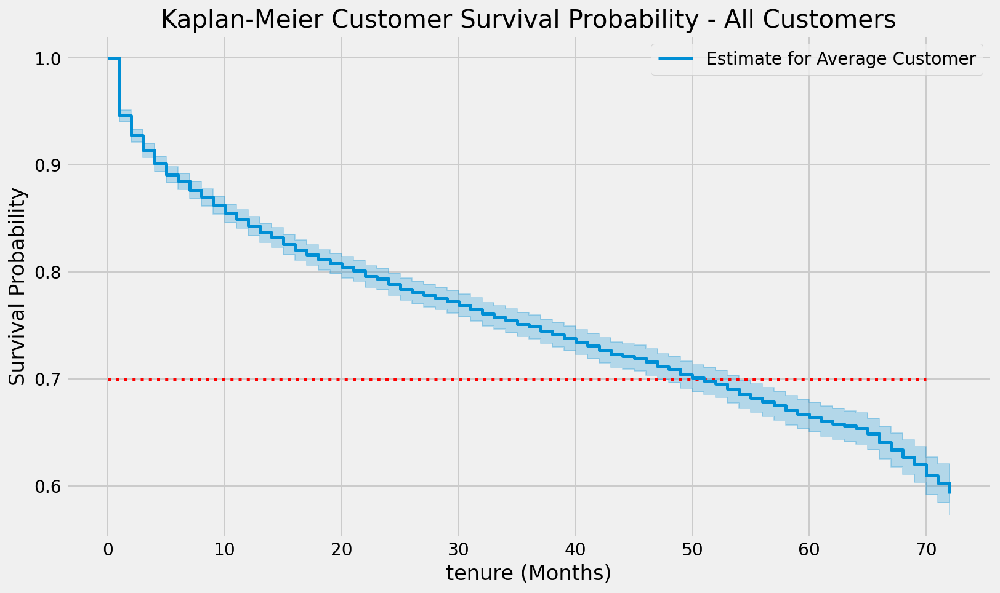

In [174]:
fig, ax = plt.subplots(figsize=(12,7))
kmf.plot_survival_function(ax=ax)
ax.set_title('Kaplan-Meier Customer Survival Probability - All Customers')
ax.set_xlabel('tenure (Months)')
ax.set_ylabel('Survival Probability')
plt.hlines(y=0.7, xmin=0, xmax=70, linestyles='dotted', colors=['red'])
plt.show()

As seen from the chart, the survival probability $S(t)$ declines with tenure. Customer retention efforts can be costly and a company will lose profitability if such measures are applied without discretion. Let's say we want to have our customer retention procedure only kick in when $S(t)$ falls below 70%. From the chart it appears that this will have to happen when the tenure exceeds 51 months. This model represents the average customer which means customer retention will always happen when a customer's tenure exceeds 51 months.

In [175]:
sum(durations==0)

11

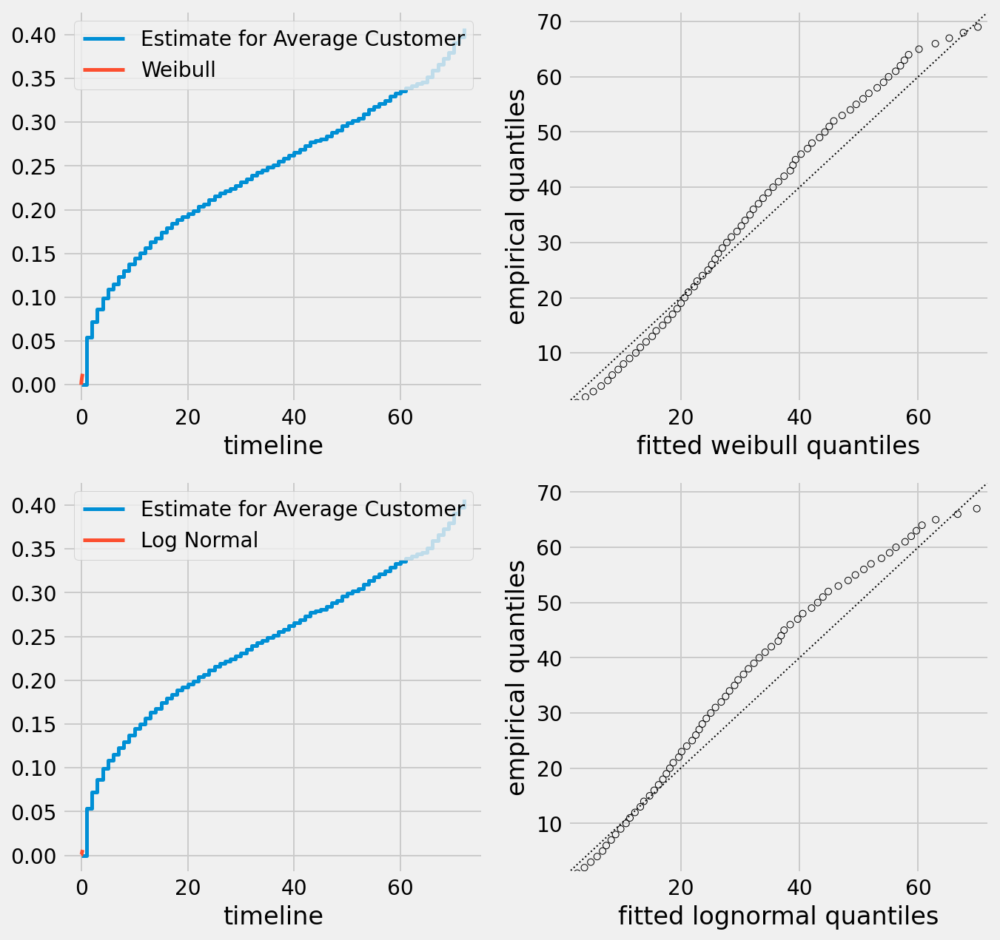

In [176]:
# QQ plots #7
from lifelines.plotting import qq_plot
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
timeline = np.linspace(0, 0.25, 100)
wf = lifelines.WeibullFitter().fit(durations+0.001, churns, label="Weibull", timeline=timeline)
lnf = lifelines.LogNormalFitter().fit(durations+0.001, churns, label="Log Normal", timeline=timeline)
# plot what we just fit, along with the KMF estimate
kmf.plot_cumulative_density(ax=axes[0][0], ci_show=False)
wf.plot_cumulative_density(ax=axes[0][0], ci_show=False)
qq_plot(wf, ax=axes[0][1])
kmf.plot_cumulative_density(ax=axes[1][0], ci_show=False)
lnf.plot_cumulative_density(ax=axes[1][0], ci_show=False)
qq_plot(lnf, ax=axes[1][1]);

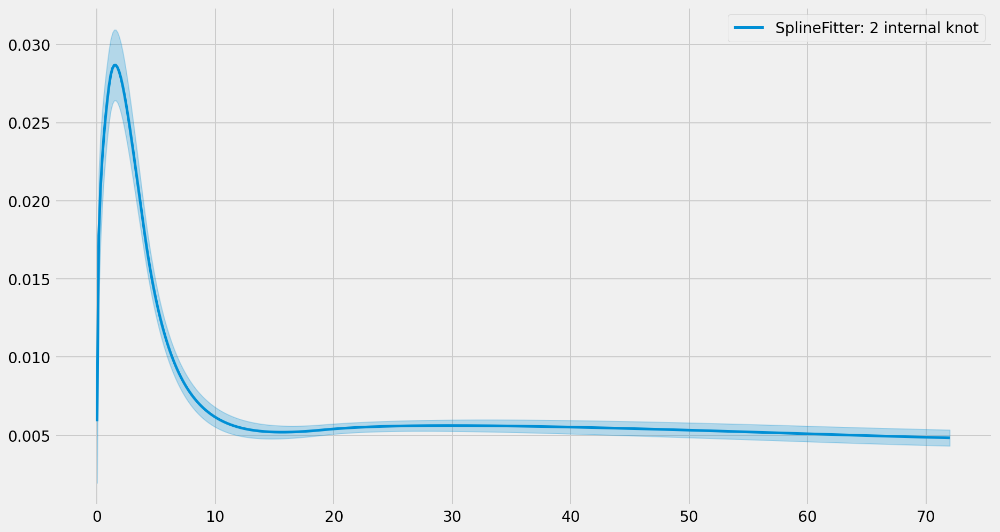

In [177]:
# best parametric model using the AIC score #7
from lifelines.utils import find_best_parametric_model
best_model, best_aic_ = find_best_parametric_model(durations+0.001, churns)
best_model.plot_hazard();

### 4.2 Survival Probability for the average customer based on segments

The previous approach is unfocused and may lead to a lot of waste. We can improve the effectiveness somewhat by studying the survival functions for different segments of the customer population. Segmentation can be performed based on the classes in categorical predictors. Let's demonstrate this approach by making use of the 'InternetService' predictor.

In [178]:
# 
#create Kaplan-Meier curve plots segmented by categoricals
def plot_categorical_survival(dft, feature, duration='tenure', event='Churn', ax=None):
    for cat in dft[feature].unique():
        idxs = dft[feature]==cat
        kmft = lifelines.KaplanMeierFitter()
        kmft.fit(dft[idxs][duration], event_observed=dft[idxs][event], label=cat)
        kmft.plot(ax=ax, label=cat)

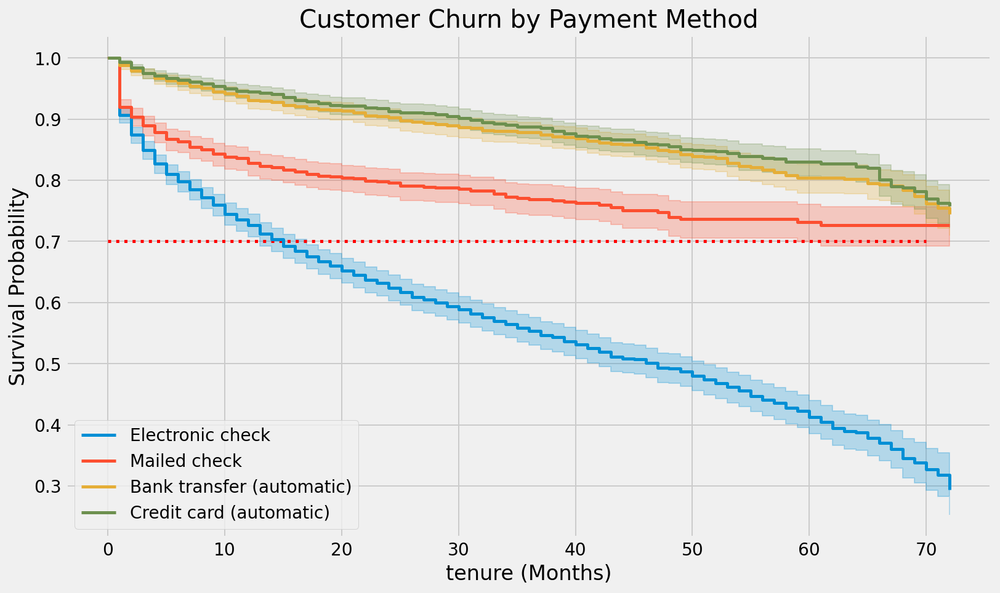

In [179]:
fig_pmt, ax_pmt = plt.subplots(figsize=(12,7))
plot_categorical_survival(dft=df, feature='PaymentMethod', ax=ax_pmt)
ax_pmt.set_title('Customer Churn by Payment Method')
ax_pmt.set_xlabel('tenure (Months)')
ax_pmt.set_ylabel('Survival Probability')
plt.hlines(y=0.7, xmin=0, xmax=70, linestyles='dotted', colors=['red'])
plt.show()

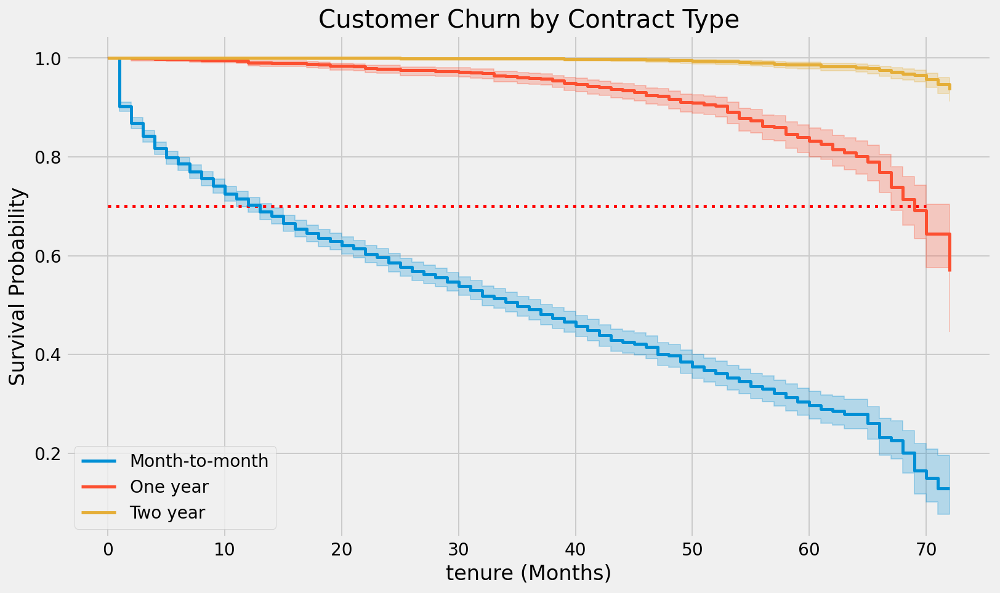

In [180]:
fig_contract, ax_contract = plt.subplots(figsize=(12,7))
plot_categorical_survival(dft=df, feature='Contract', ax=ax_contract)
ax_contract.set_title('Customer Churn by Contract Type')
ax_contract.set_xlabel('tenure (Months)')
ax_contract.set_ylabel('Survival Probability')
plt.hlines(y=0.7, xmin=0, xmax=70, linestyles='dotted', colors=['red'])
plt.show()

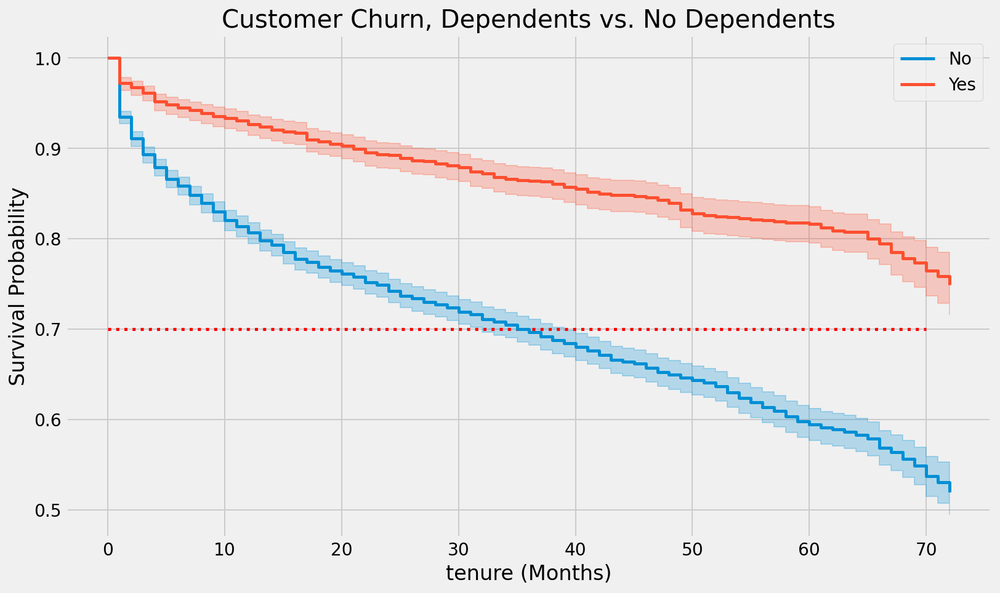

In [181]:
fig_dep, ax_dep = plt.subplots(figsize=(12,7))
plot_categorical_survival(dft=df, feature='Dependents', ax=ax_dep)
ax_dep.set_title('Customer Churn, Dependents vs. No Dependents')
ax_dep.set_xlabel('tenure (Months)')
ax_dep.set_ylabel('Survival Probability')
plt.hlines(y=0.7, xmin=0, xmax=70, linestyles='dotted', colors=['red'])
plt.show()

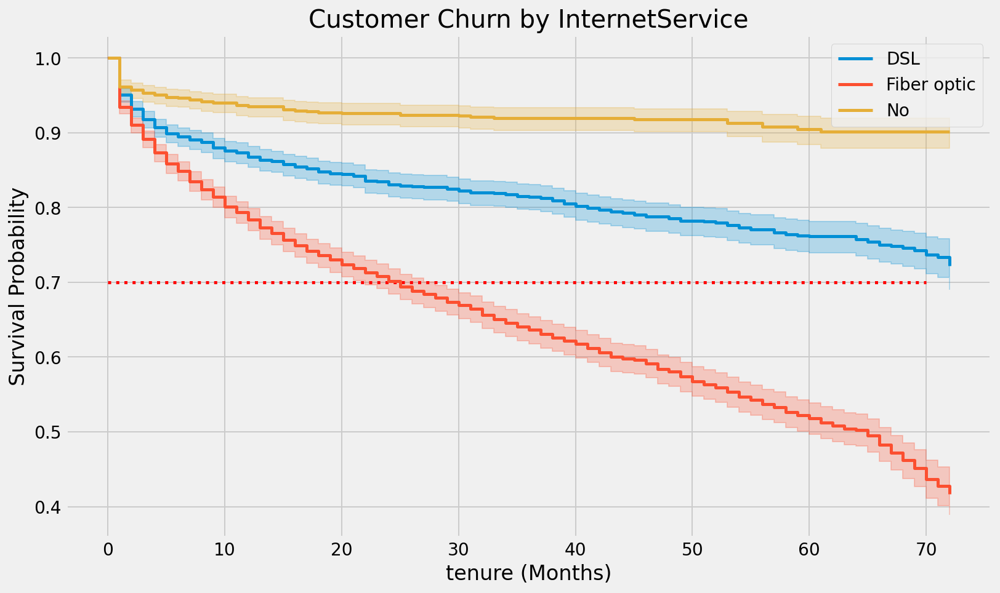

In [182]:
fig_dep, ax_dep = plt.subplots(figsize=(12,7))
plot_categorical_survival(dft=df, feature='InternetService', ax=ax_dep)
ax_dep.set_title('Customer Churn by InternetService')
ax_dep.set_xlabel('tenure (Months)')
ax_dep.set_ylabel('Survival Probability')
plt.hlines(y=0.7, xmin=0, xmax=70, linestyles='dotted', colors=['red'])
plt.show()

From the chart we see that we can be more effective by only activating the retention procedure for fiber optic customers (when their tenure exceeds about 26 months).

### 4.3 Estimate Hazard

Before we can use another approach to model the average customer, we need to make use of the concept of *hazard*. The *hazard function* or *hazard rate* was defined above. It is the event rate in the instant after $t$, given survival past $t$. In the context of customer churn the hazard is an important indicator and needs to be as low as possible. If it goes up it indicates something has changed between the company and a customer. Such a situation calls for intervention.

On a more technical level, why should we care about the hazard function? Firstly, it is related to the survival function $S(t)$. Secondly, an important technique for modeling survival time as a function of covariates (in this case customer features) depends on the hazard function. This kind of technique will be necessary to analyze an *individual customer*, rather than the whole population.

### 4.4 Nelson-Aalen estimator

The Nelson-Aalen estimator estimates the cumulative hazard rate. Like the Kaplan-Meier estimator, it is non-parametric.

#### 4.4.1 Cumulative hazard function

In [183]:
from lifelines import NelsonAalenFitter
naf = NelsonAalenFitter(alpha=0.05, nelson_aalen_smoothing=False)
naf.fit(durations=durations, event_observed=churns)
naf.cumulative_hazard_.head()

,NA_estimate
timeline,
0.0,0.000000
1.0,0.054039
2.0,0.073201
3.0,0.088408
4.0,0.102286


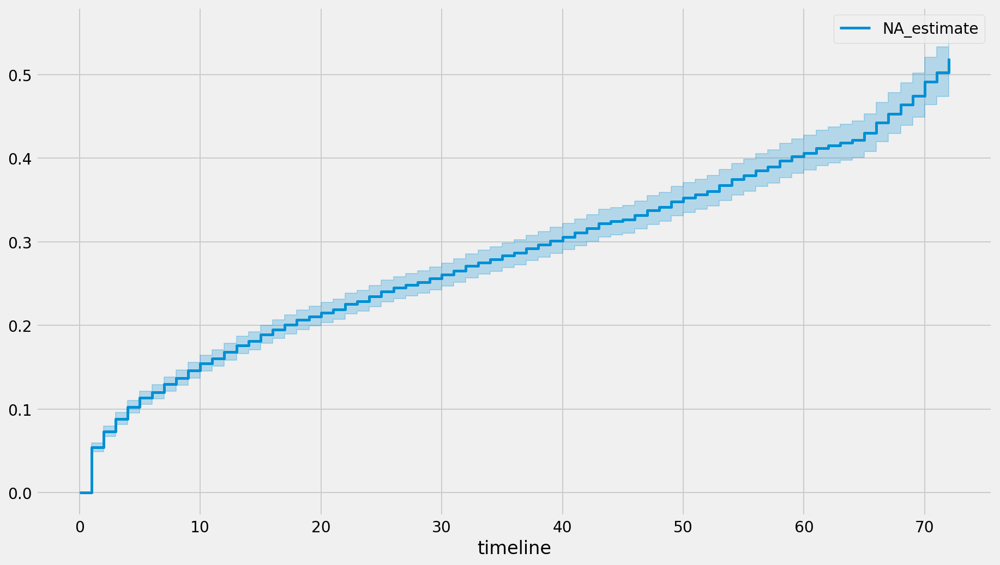

In [184]:
naf.plot();

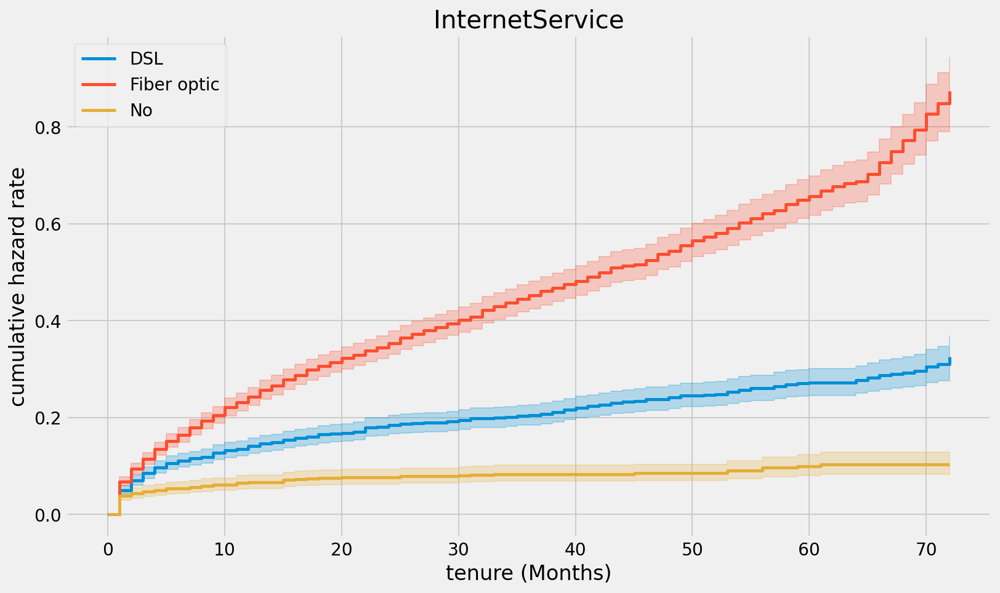

In [185]:
fig, ax = plt.subplots(figsize=(12,7))
var = 'InternetService'
for name, dft in df.groupby(var):
    idxs = df[var]==name
    naf = lifelines.NelsonAalenFitter().fit(dft['tenure'][idxs], dft['Churn'][idxs], alpha=0.05, label=name)
    naf.plot(ax=ax)
ax.set_title(var)
ax.set_xlabel('tenure (Months)')
ax.set_ylabel('cumulative hazard rate')
plt.show()

#### 4.4.2 Hazard function

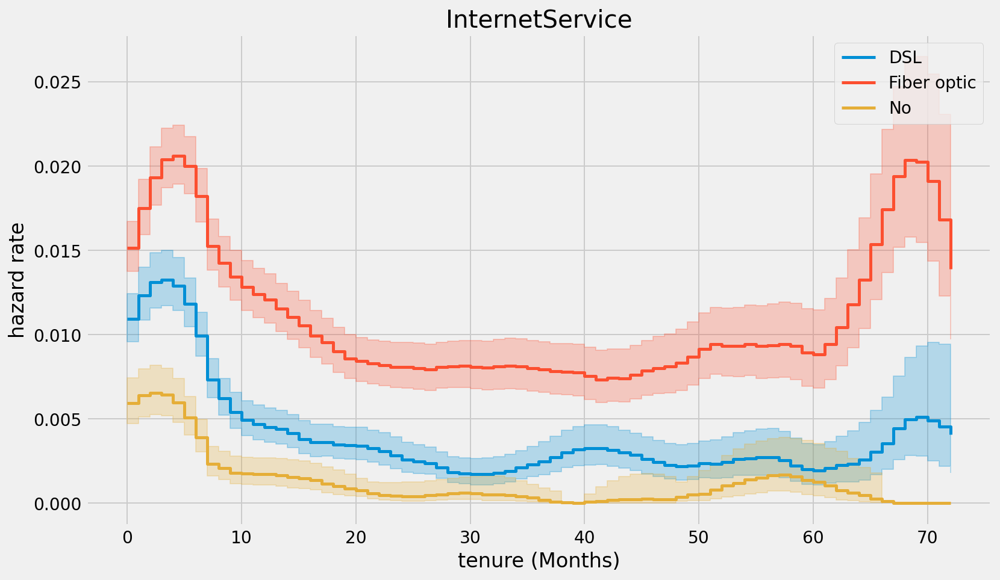

In [186]:
fig, ax = plt.subplots(figsize=(12,7))
var = 'InternetService'
for name, dft in df.groupby(var):
    idxs = df[var]==name
    naf = lifelines.NelsonAalenFitter().fit(dft['tenure'][idxs], dft['Churn'][idxs], alpha=0.05, label=name)
    naf.plot_hazard(ax=ax, bandwidth=6)
ax.set_title(var)
ax.set_xlabel('tenure (Months)')
ax.set_ylabel('hazard rate')
plt.show()

### 4.2 Survival Regression Model

So far, we have only looked at analyzing groups of customers. Now we are going to setup a model for an individual customer. This will increase the effectiveness of the customer retention mechanism. We next make use of the *Cox Proportional Hazards model*. This will allow us to model the survival time as a function of the covariates (i.e. the customer features).

#### 4.2.1 Proportional Hazards Assumption

The *proportional hazards assumption* states

$h(t|x_i) = h_0(t) \text{exp} (\sum_{j=1}^{p}x_{ij}\beta_j)$

where $h_0(t)$, an unspecified function, is known as the *baseline hazard*. It is the hazard function for an individual with features $x_{i1} = ... = x_{ip} = 0$. The term *proportional hazards* derives from the fact that the hazard function for an individual with feature vector $x_i$ is some unknown function $h_0(t)$ times the factor $\text{exp} (\sum_{j=1}^{p}x_{ij}\beta_j)$. The latter quantity is called the *relative risk* for the feature vector $x_i = (x_{i1}, ..., x_{ip})^T$, relative to that for the feature vector $x_i = (0, ..., 0)^T$.

The baseline hazard function $h_0(t)$ can take on any form. The only assumption is that a one-unit increase in $x_{ij}$ corresponds to an increase in $h(t|x_i)$ by a factor of exp($\beta_j$).

#### 4.2.2 Cox Proportional Hazards Regression

We need to do some pre-processing before applying this model.

In [187]:
df

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
customerID,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,Female,0,Yes,No,1.0,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,False
5575-GNVDE,Male,0,No,No,34.0,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,False
3668-QPYBK,Male,0,No,No,2.0,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,True
7795-CFOCW,Male,0,No,No,45.0,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,False
9237-HQITU,Female,0,No,No,2.0,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6840-RESVB,Male,0,Yes,Yes,24.0,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.50,False
2234-XADUH,Female,0,Yes,Yes,72.0,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.90,False
4801-JZAZL,Female,0,Yes,Yes,11.0,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,False


In [188]:
# cats = ['gender',   'MultipleLines', 'Contract', 'PaymentMethod',   'InternetService']
X = pd.get_dummies(df.drop(['Churn', 'tenure'], axis=1), drop_first=True)
y = df.loc[:, ['tenure', 'Churn']]
df_clean = pd.concat([X, y], axis=1)

In [189]:
df_clean

,SeniorCitizen,MonthlyCharges,TotalCharges,gender_Male,Partner_Yes,Dependents_Yes,PhoneService_Yes,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaperlessBilling_Yes,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,tenure,Churn
customerID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,0,29.85,29.85,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1.0,False
5575-GNVDE,0,56.95,1889.50,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,34.0,False
3668-QPYBK,0,53.85,108.15,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,2.0,True
7795-CFOCW,0,42.30,1840.75,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,45.0,False
9237-HQITU,0,70.70,151.65,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,2.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6840-RESVB,0,84.80,1990.50,1,1,1,1,0,1,0,0,0,1,0,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,24.0,False
2234-XADUH,0,103.20,7362.90,0,1,1,1,0,1,1,0,0,0,0,1,0,1,0,0,0,1,0,1,1,0,1,1,0,0,72.0,False
4801-JZAZL,0,29.60,346.45,0,1,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,11.0,False


In [190]:
df_clean.columns

Index(['SeniorCitizen', 'MonthlyCharges', 'TotalCharges', 'gender_Male',
       'Partner_Yes', 'Dependents_Yes', 'PhoneService_Yes',
       'MultipleLines_No phone service', 'MultipleLines_Yes',
       'InternetService_Fiber optic', 'InternetService_No',
       'OnlineSecurity_No internet service', 'OnlineSecurity_Yes',
       'OnlineBackup_No internet service', 'OnlineBackup_Yes',
       'DeviceProtection_No internet service', 'DeviceProtection_Yes',
       'TechSupport_No internet service', 'TechSupport_Yes',
       'StreamingTV_No internet service', 'StreamingTV_Yes',
       'StreamingMovies_No internet service', 'StreamingMovies_Yes',
       'Contract_One year', 'Contract_Two year', 'PaperlessBilling_Yes',
       'PaymentMethod_Credit card (automatic)',
       'PaymentMethod_Electronic check', 'PaymentMethod_Mailed check',
       'tenure', 'Churn'],
      dtype='object')

#### 4.2.3 Split the data

In [191]:
import numpy as np
num_customers = df_clean.shape[0]

num_train = int(num_customers * 0.7)
train_customers = np.random.choice(df_clean.index, size=num_train, replace=False)
df_train = df_clean.loc[train_customers]

num_valid = int((num_customers - num_train) * 0.5)
valid_customers = np.random.choice(df_clean.drop(train_customers).index, size=num_valid, replace=False)
df_valid = df_clean.loc[valid_customers]

test_customers = df.drop(train_customers).drop(valid_customers).index
df_test = df_clean.loc[test_customers]

In [192]:
total = df_train.shape[0] + df_valid.shape[0] + df_test.shape[0]
print('Train', df_train.shape, df_train.shape[0]/total*100)
print('Dev', df_valid.shape, df_valid.shape[0]/total*100)
print('Test', df_test.shape, df_test.shape[0]/total*100)
print('Total:', total)
assert total == df.shape[0]

Train (4930, 31) 69.99858015050404
Dev (1056, 31) 14.99361067726821
Test (1057, 31) 15.007809172227743
Total: 7043


In [80]:
cph = lifelines.CoxPHFitter()
cph.fit(df_train, duration_col='tenure', event_col='Churn', show_progress=False)
cph.print_summary()

ConvergenceError: ignored

In [81]:
# ConvergenceError: Convergence halted due to matrix inversion problems. 
# Suspition is high collinearity. Please see the following tips in the lifelines documentation: 
# https://lifelines.readthedocs.io/en/latest/Examples.html#problems-with-convergence-in-the-cox-proportional-hazard-modelMatrix is singular.

To address this problem we will make use of the variance inflation factor (VIF) approach.

In [82]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [83]:
def calc_vif(X):
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return(vif)

In [84]:
feature_vif = calc_vif(df_train.drop(['Churn', 'tenure'], axis=1))
feature_vif.sort_values('VIF')

,variables,VIF
3,gender_Male,1.002632
0,SeniorCitizen,1.155752
25,PaperlessBilling_Yes,1.219196
5,Dependents_Yes,1.370769
4,Partner_Yes,1.430055
23,Contract_One year,1.537983
26,PaymentMethod_Credit card (automatic),1.576695
28,PaymentMethod_Mailed check,1.799718
27,PaymentMethod_Electronic check,1.976341
24,Contract_Two year,2.266687


In [85]:
features_keep = feature_vif.loc[feature_vif['VIF'] < 10, 'variables'].tolist()
features_keep.extend(['tenure', 'Churn'])
features_keep

['SeniorCitizen',
 'TotalCharges',
 'gender_Male',
 'Partner_Yes',
 'Dependents_Yes',
 'MultipleLines_Yes',
 'OnlineSecurity_Yes',
 'OnlineBackup_Yes',
 'DeviceProtection_Yes',
 'TechSupport_Yes',
 'Contract_One year',
 'Contract_Two year',
 'PaperlessBilling_Yes',
 'PaymentMethod_Credit card (automatic)',
 'PaymentMethod_Electronic check',
 'PaymentMethod_Mailed check',
 'tenure',
 'Churn']

In [86]:
cph = lifelines.CoxPHFitter()
cph.fit(
    df_train.loc[:, features_keep], 
    duration_col='tenure', 
    event_col='Churn', 
    show_progress=False)
cph.print_summary()

<lifelines.CoxPHFitter: fitted with 4930 total observations, 3639 right-censored observations>
             duration col = 'tenure'
                event col = 'Churn'
      baseline estimation = breslow
   number of observations = 4930
number of events observed = 1291
   partial log-likelihood = -8752.37
         time fit was run = 2022-04-11 17:48:43 UTC

---
                                        coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                                     
SeniorCitizen                           0.17       1.19       0.07             0.04             0.31                 1.04                 1.36
TotalCharges                           -0.00       1.00       0.00            -0.00            -0.00                 1.00                 1.00
gender_Male                            -0.00       1.00       0.06            -0.11             0.11                 0.89                 1.11
Partner_Yes                            -0.21       0.81       0.07            -0.34            -0.08                 0.71                 0.92
Dependents_Yes                         -0.25       0.78       0.08            -0.42            -0.09                 0.66                 0.91
MultipleLines_Yes                       0.51       1.67       0.06             0.39             0.63                 1.48                 1.88
OnlineSecurity_Yes                     -0.18       0.84       0.08            -0.33            -0.03                 0.72                 0.97
OnlineBackup_Yes                        0.04       1.04       0.07            -0.10             0.17                 0.91                 1.18
DeviceProtection_Yes                    0.33       1.39       0.07             0.20             0.46                 1.22                 1.58
TechSupport_Yes                         0.01       1.01       0.08            -0.15             0.16                 0.86                 1.17
Contract_One year                      -1.95       0.14       0.11            -2.17            -1.73                 0.11                 0.18
Contract_Two year                      -4.43       0.01       0.20            -4.83            -4.02                 0.01                 0.02
PaperlessBilling_Yes                    0.49       1.63       0.07             0.35             0.62                 1.43                 1.86
PaymentMethod_Credit card (automatic)  -0.11       0.89       0.11            -0.33             0.10                 0.72                 1.10
PaymentMethod_Electronic check          0.58       1.79       0.09             0.41             0.75                 1.51                 2.12
PaymentMethod_Mailed check              0.11       1.12       0.11            -0.09             0.32                 0.91                 1.38

                                        cmp to      z      p   -log2(p)
covariate                                                              
SeniorCitizen                             0.00   2.51   0.01       6.37
TotalCharges                              0.00 -26.70 <0.005     519.39
gender_Male                               0.00  -0.05   0.96       0.06
Partner_Yes                               0.00  -3.16 <0.005       9.30
Dependents_Yes                            0.00  -3.04 <0.005       8.73
MultipleLines_Yes                         0.00   8.29 <0.005      53.03
OnlineSecurity_Yes                        0.00  -2.29   0.02       5.50
OnlineBackup_Yes                          0.00   0.54   0.59       0.76
DeviceProtection_Yes                      0.00   5.04 <0.005      21.03
TechSupport_Yes                           0.00   0.08   0.94       0.09
Contract_One year                         0.00 -17.53 <0.005     226.23
Contract_Two year                         0.00 -21.59 <0.005     340.97
PaperlessBilling_Yes                      0.00   7.22

The summary provide some key information:

* p-values indicate how significant a feature is
* exp(coef) indicate by how much the hazard will increase when the feature is increased by 1 unit
* concordance

## 5 Evaluation

### 5.1 Plot the coefficients

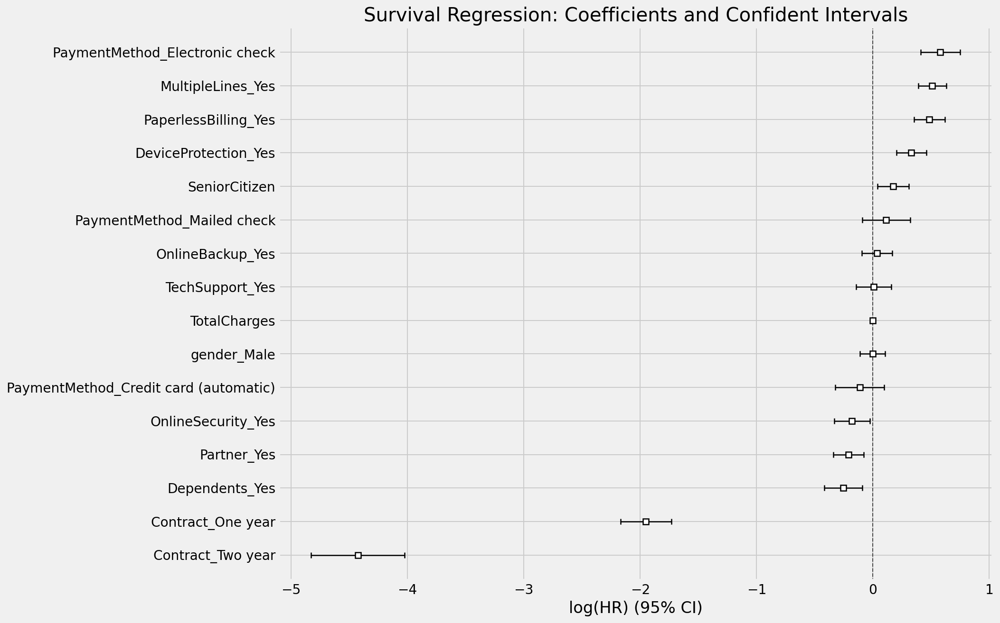

In [87]:
# plotting coefficients
fig_coef, ax_coef = plt.subplots(figsize=(12,10))
ax_coef.set_title('Survival Regression: Coefficients and Confident Intervals')
cph.plot(ax=ax_coef);

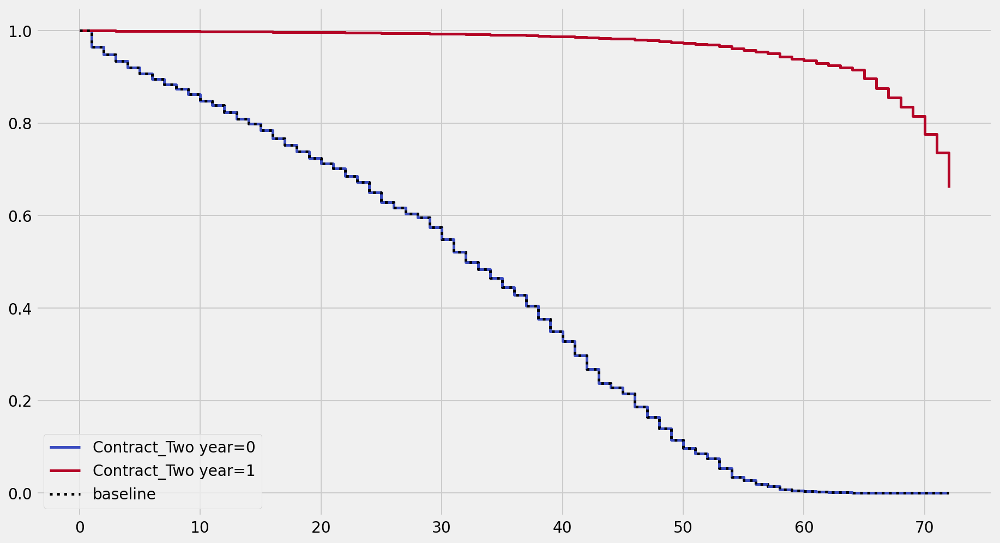

In [89]:
cph.plot_partial_effects_on_outcome(
    covariates='Contract_Two year', 
    values=[0, 1], 
    plot_baseline=True,
    cmap='coolwarm');

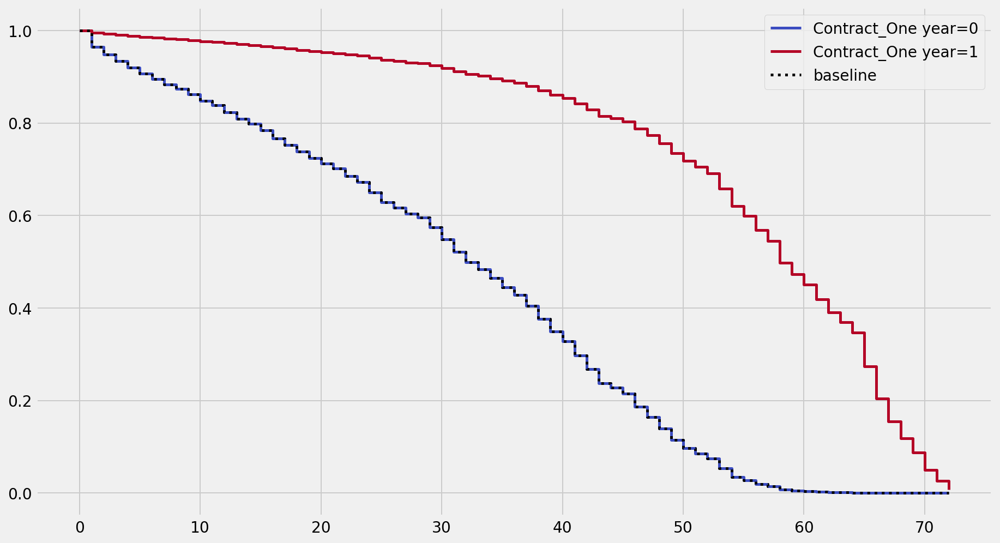

In [90]:
cph.plot_partial_effects_on_outcome(
    covariates='Contract_One year', 
    values=[0, 1], 
    plot_baseline=True,
    cmap='coolwarm');

### 5.2 Predict on the train set

In [91]:
surv_pred_train = cph.predict_survival_function(df_train)
surv_median_pred_train = cph.predict_median(df_train)

In [92]:
surv_pred_train

7923-IYJWY    3665-JATSN  3214-IYUUQ  5181-OABFK  0689-DSXGL  \
0.0     1.000000  1.000000e+00    1.000000    1.000000    1.000000   
1.0     0.999997  8.817854e-01    0.999959    0.999949    0.998666   
2.0     0.999996  8.280596e-01    0.999939    0.999923    0.998000   
3.0     0.999995  7.854697e-01    0.999922    0.999902    0.997442   
4.0     0.999993  7.441616e-01    0.999904    0.999880    0.996870   
...          ...           ...         ...         ...         ...   
68.0    0.998804  1.013692e-23    0.983017    0.978646    0.570246   
69.0    0.998637  6.053170e-27    0.980659    0.975688    0.527061   
70.0    0.998319  4.580512e-33    0.976197    0.970098    0.453862   
71.0    0.997966  7.559672e-40    0.971277    0.963941    0.384567   
72.0    0.997247  1.035852e-53    0.961298    0.951477    0.274095   

      5630-IXDXV    0841-NULXI    4770-QAZXN  8717-VCTXJ  2480-EJWYP  \
0.0     1.000000  1.000000e+00  1.000000e+00    1.000000    1.000000   
1.0     0.992999  8.008539e-01  9.442525e-01    0.990432    0.999776   
2.0     0.989519  7.167381e-01  9.175719e-01    0.985686    0.999664   
3.0     0.986605  6.529502e-01  8.957445e-01    0.981716    0.999570   
4.0     0.983633  5.935593e-01  8.739499e-01    0.977672    0.999474   
...          ...           ...           ...         ...         ...   
68.0    0.051984  2.572138e-41  3.279588e-11    0.017491    0.910024   
69.0    0.034342  5.240232e-47  1.111395e-12    0.009919    0.898073   
70.0    0.015631  8.209156e-58  1.798708e-15    0.003378    0.875813   
71.0    0.006534  8.746409e-70  1.453829e-18    0.001024    0.851792   
72.0    0.001099  2.952429e-94  6.943377e-25    0.000089    0.804723   

      0334-ZFJSR    8749-CLJXC  7576-ASEJU  6303-KFWSL    3814-MLAXC  \
0.0     1.000000  1.000000e+00    1.000000    1.000000  1.000000e+00   
1.0     0.999147  9.167411e-01    0.999510    0.986948  9.781025e-01   
2.0     0.998721  8.777726e-01    0.999265    0.980489  9.673410e-01   
3.0     0.998363  8.463233e-01    0.999059    0.975097  9.583932e-01   
4.0     0.997997  8.153130e-01    0.998849    0.969612  9.493243e-01   
...          ...           ...         ...         ...           ...   
68.0    0.698218  1.292678e-16    0.813522    0.003969  8.979407e-05   
69.0    0.663923  7.652741e-19    0.790319    0.001828  2.431456e-05   
70.0    0.603376  4.510944e-23    0.748071    0.000419  2.035231e-06   
71.0    0.542714  9.284151e-28    0.703891    0.000082  1.303079e-07   
72.0    0.437032  2.446325e-37    0.621536    0.000003  4.733388e-10   

        3470-BTGQO    3566-HJGPK    1376-HHBDV  0795-XCCTE    8063-GBATB  \
0.0   1.000000e+00  1.000000e+00  1.000000e+00    1.000000  1.000000e+00   
1.0   9.721212e-01  8.709435e-01  9.701837e-01    0.999632  9.434822e-01   
2.0   9.584832e-01  8.128379e-01  9.556198e-01    0.999449  9.164495e-01   
3.0   9.471757e-01  7.670376e-01  9.435557e-01    0.999295  8.943424e-01   
4.0   9.357449e-01  7.228485e-01  9.313703e-01    0.999137  8.722761e-01   
...            ...           ...           ...         ...           ...   
68.0  6.793993e-06  5.555331e-26  2.934170e-06    0.856637  2.326184e-11   
69.0  1.281017e-06  1.598646e-29  4.918020e-07    0.838252  7.512383e-13   
70.0  5.393337e-08  3.025165e-36  1.655865e-08    0.804424  1.109582e-15   
71.0  1.612593e-09  1.074901e-43  3.864888e-10    0.768533  8.104215e-19   
72.0  1.235373e-12  6.380891e-59  1.784711e-13    0.700077  3.146517e-25   

        9860-LISIZ    6469-MRVET     6618-RYATB    7107-UBYKY  5879-HMFFH  \
0.0   1.000000e+00  1.000000e+00   1.000000e+00  1.000000e+00    1.000000   
1.0   9.527290e-01  9.800779e-01   7.322816e-01  8.968655e-01    0.999996   
2.0   9.299525e-01  9.702724e-01   6.267005e-01  8.493877e-01    0.999993   
3.0   9.112422e-01  9.621119e-01   5.498738e-01  8.114556e-01    0.999992   
4.0   8.924891e-01  9.538338e-01   4.810092e-01  7.743994e-01    0.999990   
...            ...           ...            ...           ..

In [93]:
kmf.survival_function_

,Estimate for Average Customer
timeline,
0.0,1.000000
1.0,0.945961
2.0,0.927835
3.0,0.913725
4.0,0.901045
...,...
68.0,0.626858
69.0,0.620135
70.0,0.609657


In [94]:
import plotly.graph_objs as go
fig = go.Figure()
buttons = []
fig.add_trace(
    go.Scatter(
        x=kmf.survival_function_.index, 
        #.y=kmf.survival_function_['KM_estimate'],
        y=kmf.survival_function_,
        marker_color="black",
        #.name='KM estimate'
    )
)
buttons.append(dict(method='restyle', 
                    #.label='KM Estimate', 
                    #.args=[{'y': [kmf.survival_function_['KM_estimate'].values]}]))
                    args=[{'y': [kmf.survival_function_.values]}]))

In [95]:
for customerID in surv_pred_train.columns[0:50]:
    #.color = 'red' if df_train_clean.loc[customerID, 'status'] else 'blue'
    color = 'red' if df_train.loc[customerID, 'Churn'] else 'blue'
    customer_probabilities = surv_pred_train[customerID]
    fig.add_trace(
        go.Scatter(
            x=surv_pred_train.index, 
            y=customer_probabilities,
            marker_color=color,
            name=customerID
        )
    )
    buttons.append(dict(method='restyle',
                        label=customerID,
                        args=[{'y': [customer_probabilities.values]}])
                  )
updatemenu = [{}]
updatemenu[0]['buttons'] = buttons
updatemenu[0]['direction'] = 'down'
updatemenu[0]['showactive'] = True

# update layout and show figure
fig.update_layout(updatemenus=updatemenu)

In [96]:
surv_pred_train.columns[0:5]

Index(['7923-IYJWY', '3665-JATSN', '3214-IYUUQ', '5181-OABFK', '0689-DSXGL'], dtype='object')

In [97]:
surv_median_pred_train

7923-IYJWY     inf
3665-JATSN    13.0
3214-IYUUQ     inf
5181-OABFK     inf
0689-DSXGL    70.0
              ... 
7503-QQRVF    31.0
9971-ZWPBF    46.0
8612-GXIDD    70.0
8065-QBYTO     inf
7764-BDPEE    23.0
Name: 0.5, Length: 4930, dtype: float64

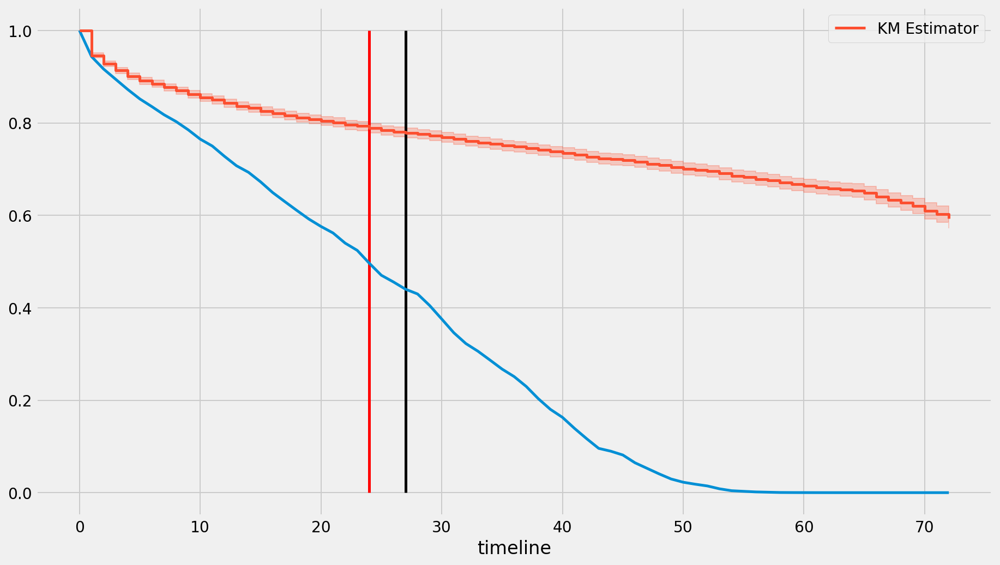

In [98]:
patient_name = surv_pred_train.columns[19]
pred_median = surv_median_pred_train
ax = surv_pred_train[patient_name].plot()
kmf.plot(ax=ax, label='KM Estimator')
plt.vlines(df_train.loc[patient_name, 'tenure'], ymin=0, ymax=1)
plt.vlines(surv_median_pred_train[patient_name], ymin=0, ymax=1, color='red')

### 5.3 Predict on the validation set

In [99]:
surv_pred_valid = cph.predict_survival_function(df_valid)
surv_median_pred_valid = cph.predict_median(df_valid)

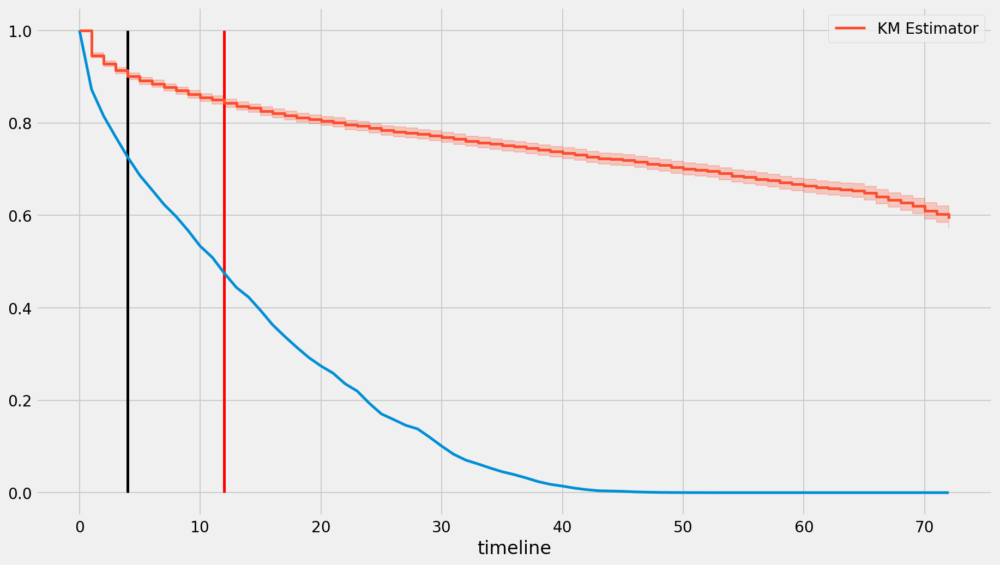

In [100]:
patient_name = surv_pred_valid.columns[100]
pred_median = surv_median_pred_valid
ax = surv_pred_valid[patient_name].plot()
kmf.plot(ax=ax, label='KM Estimator')
plt.vlines(df_valid.loc[patient_name, 'tenure'], ymin=0, ymax=1)
plt.vlines(surv_median_pred_valid[patient_name], ymin=0, ymax=1, color='red');

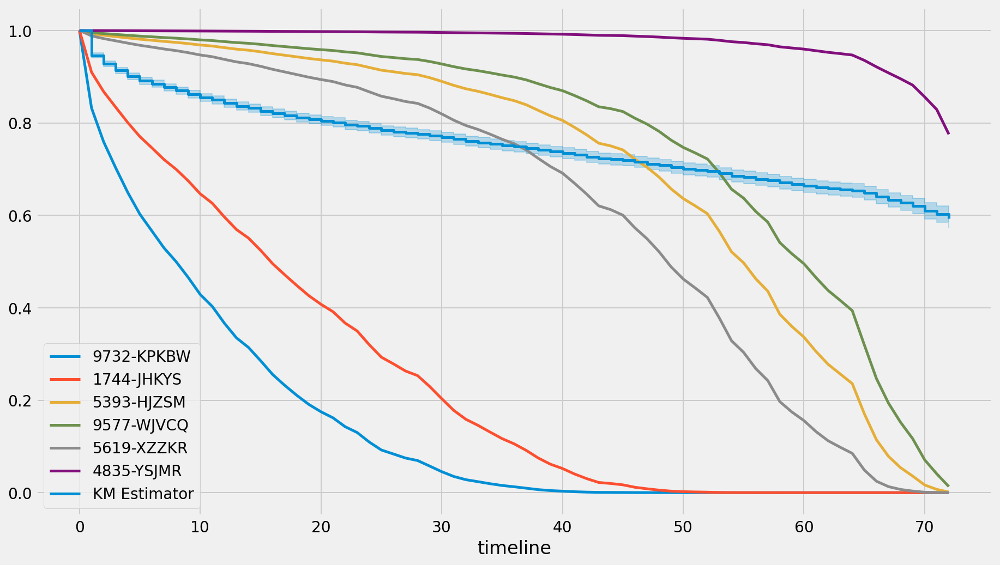

In [101]:
ax = surv_pred_valid.iloc[:, 0:6].plot();
kmf.plot(ax=ax, label='KM Estimator');

### 5.4 Concordance

https://stats.stackexchange.com/questions/478294/how-the-concordance-index-is-calculated-in-cox-model-if-the-actual-event-times-a/478305#478305

In [102]:
from lifelines.utils import concordance_index
concordance_index(df_valid['tenure'], -cph.predict_partial_hazard(df_valid), df_valid['Churn'])

0.9264000512153804

### 5.5 Check assumptions

The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some
covariates will be below the threshold by chance. This is compounded when there are many covariates.
Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and visual tests to determine
the most serious violations. Produce visual plots using ``check_assumptions(..., show_plots=True)``
and looking for non-constant lines. See link [A] below for a full example.



<lifelines.StatisticalResult: proportional_hazard_test>
 null_distribution = chi squared
degrees_of_freedom = 1
             model = <lifelines.CoxPHFitter: fitted with 4930 total observations, 3639 right-censored observations>
         test_name = proportional_hazard_test

---
                                            test_statistic      p  -log2(p)
Contract_One year                     km             59.60 <0.005     46.29
                                      rank           44.75 <0.005     35.38
Contract_Two year                     km             53.45 <0.005     41.78
                                      rank           36.86 <0.005     29.55
Dependents_Yes                        km              0.36   0.55      0.87
                                      rank            0.02   0.89      0.16
DeviceProtection_Yes                  km              0.42   0.51      0.96
                                      rank            1.64   0.20      2.32
MultipleLines_Yes                     km              4.20   0.04      4.63
                                      rank           14.12 <0.005     12.51
OnlineBackup_Yes                      km              0.14   0.71      0.50
                                      rank            0.02   0.88      0.19
OnlineSecurity_Yes                    km              3.64   0.06      4.15
                                      rank            4.69   0.03      5.04
PaperlessBilling_Yes                  km              0.08   0.78      0.36
                                      rank            0.48   0.49      1.04
Partner_Yes                           km              0.04   0.85      0.23
                                      rank            0.46   0.50      1.00
PaymentMethod_Credit card (automatic) km              6.36   0.01      6.42
                                      rank            4.97   0.03      5.27
PaymentMethod_Electronic check        km              4.88   0.03      5.20
                                      rank            2.27   0.13      2.92
PaymentMethod_Mailed check            km              3.41   0.06      3.95
                                      rank            0.52   0.47      1.09
SeniorCitizen                         km              8.42 <0.005      8.07
                                      rank            4.85   0.03      5.18
TechSupport_Yes                       km              4.43   0.04      4.82
                                      rank            7.02   0.01      6.95
TotalCharges                          km            623.93 <0.005    455.04
                                      rank          385.43 <0.005    282.65
gender_Male                           km              1.52   0.22      2.20
                                      rank            0.47   0.49      1.02



1. Variable 'SeniorCitizen' failed the non-proportional test: p-value is 0.0037.

   Advice: with so few unique values (only 2), you can include `strata=['SeniorCitizen', ...]` in
the call in `.fit`. See documentation in link [E] below.

   Bootstrapping lowess lines. May take a moment...


2. Variable 'TotalCharges' failed the non-proportional test: p-value is <5e-05.

   Advice 1: the functional form of the variable 'TotalCharges' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'TotalCharges' using pd.cut, and then specify it in
`strata=['TotalCharges', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a mome

[[<matplotlib.axes._subplots.AxesSubplot at 0x7fa30f24de90>,

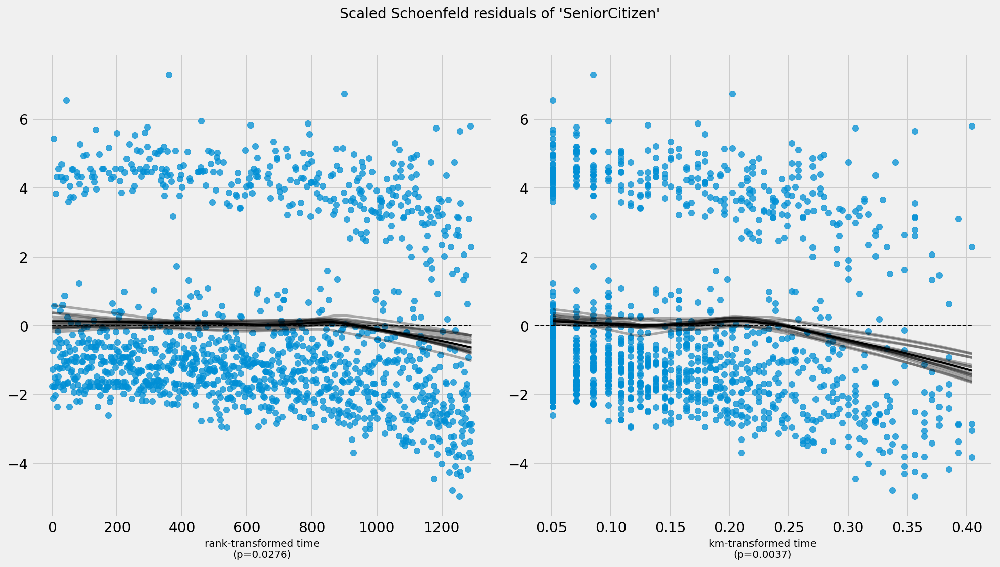

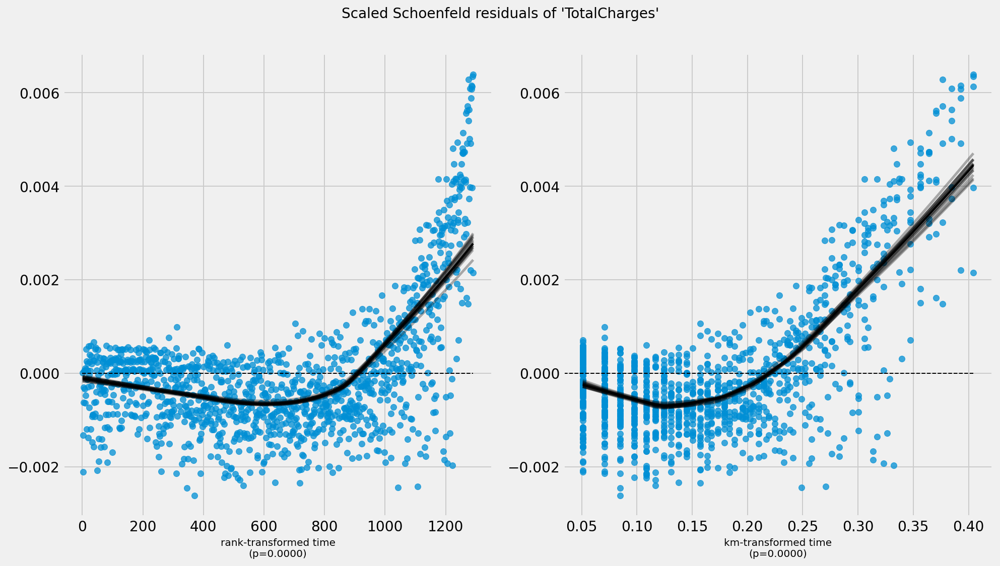

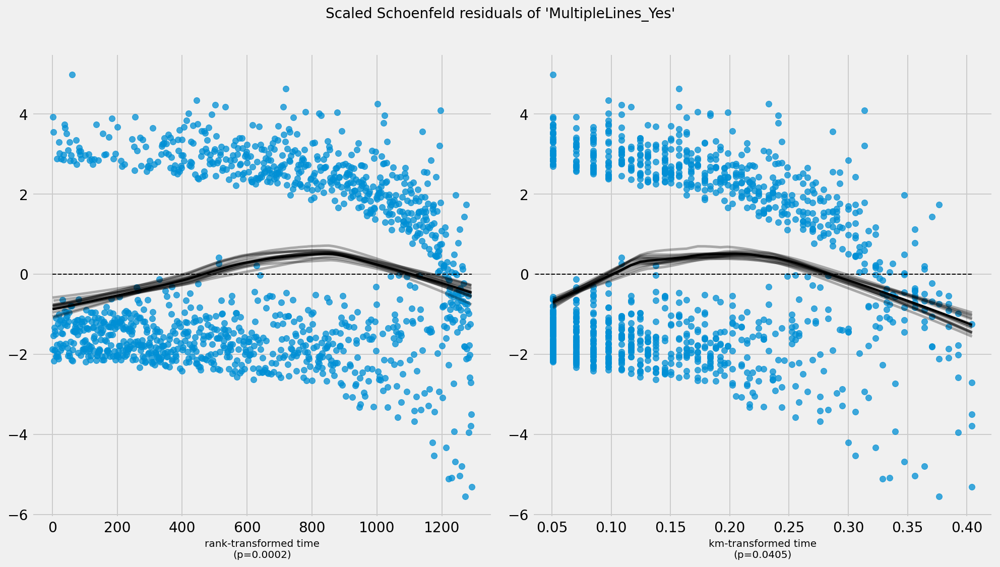

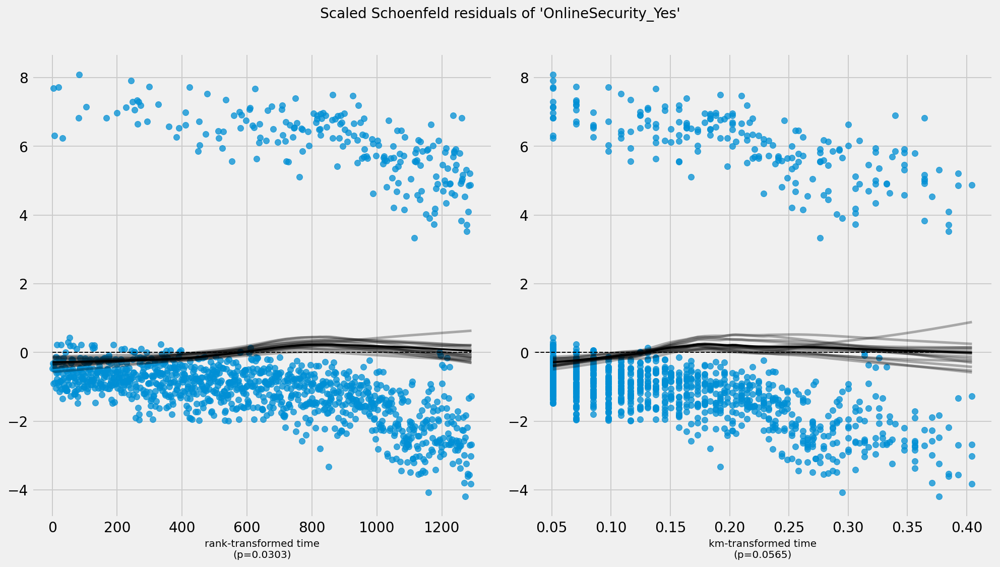

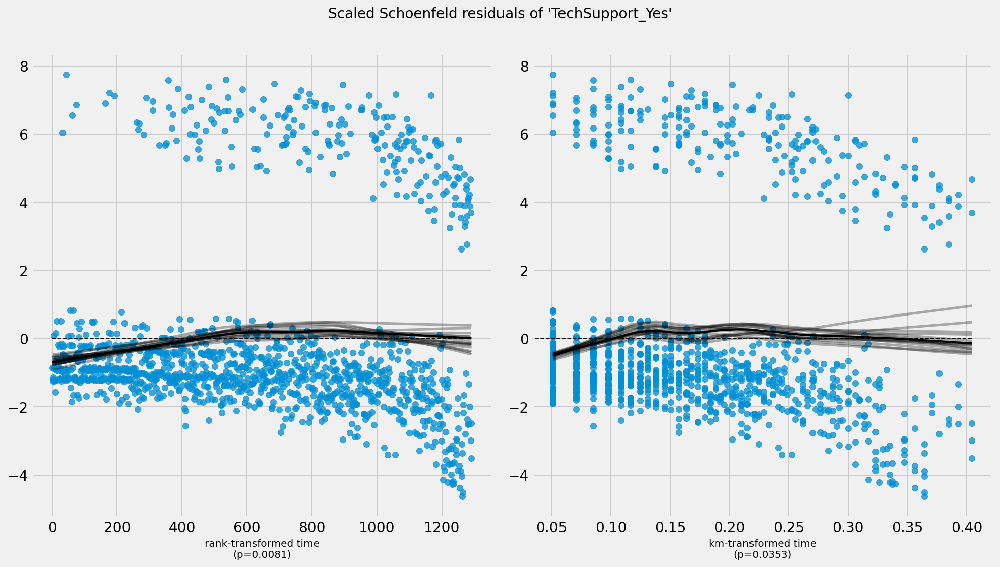

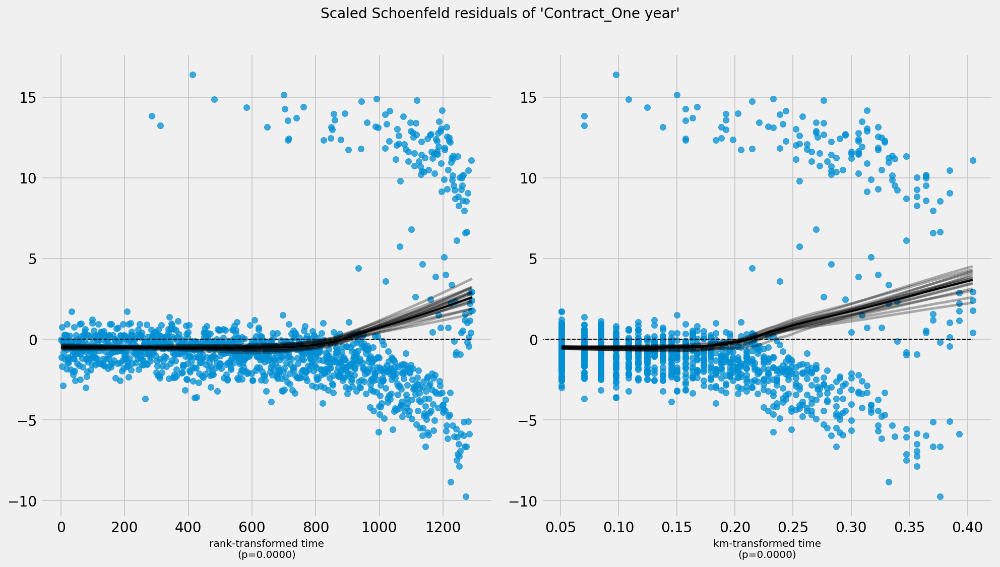

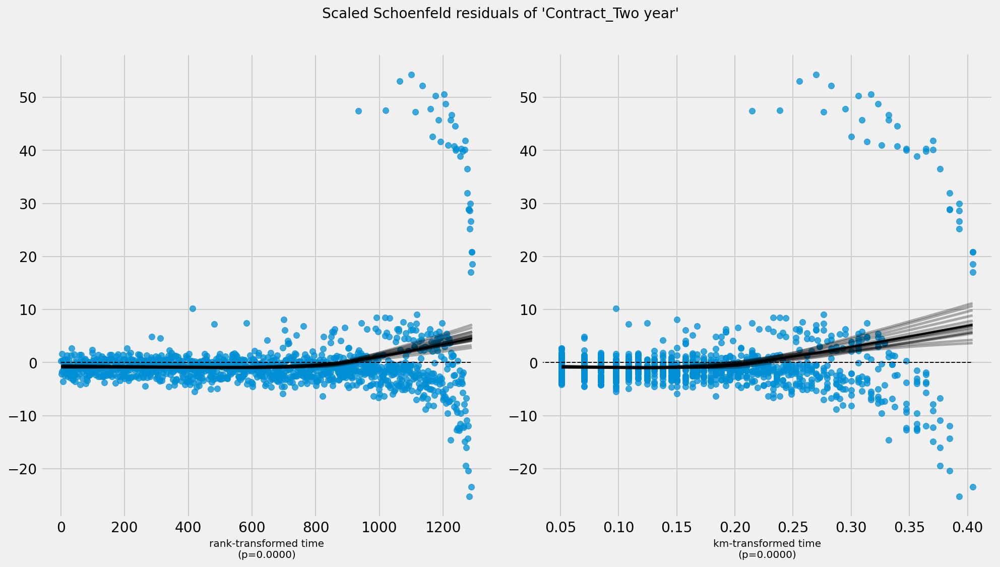

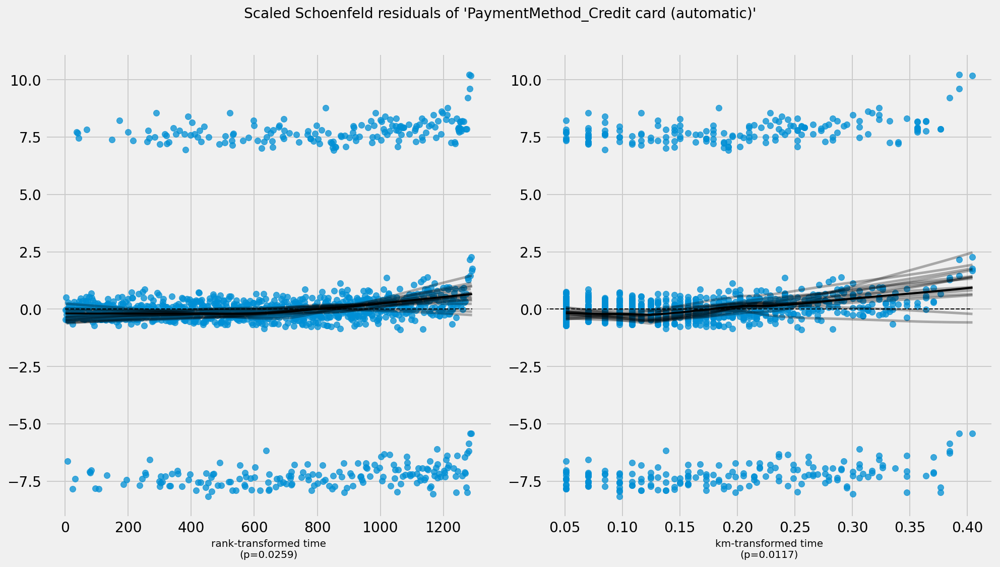

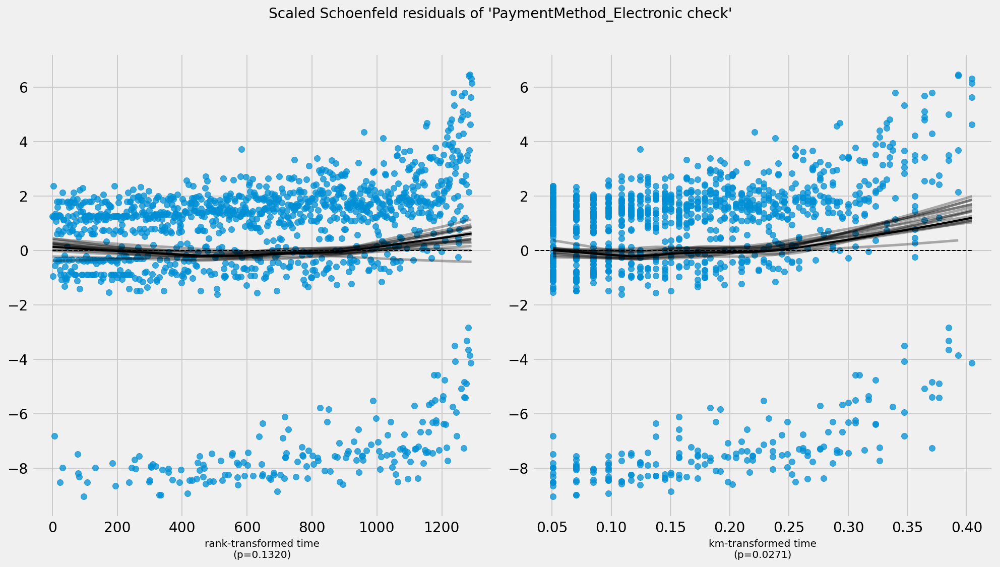

In [103]:
%%time
cph.check_assumptions(df_train.loc[:, features_keep], p_value_threshold=0.05, show_plots=True)

In [104]:
assumptions_results = lifelines.statistics.proportional_hazard_test(
    cph, df_train.loc[:, features_keep], time_transform='rank'
)
assumptions_results.print_summary()

<lifelines.StatisticalResult: proportional_hazard_test>
    time_transform = rank
 null_distribution = chi squared
degrees_of_freedom = 1
             model = <lifelines.CoxPHFitter: fitted with 4930 total observations, 3639 right-censored observations>
         test_name = proportional_hazard_test

---
                                       test_statistic      p  -log2(p)
Contract_One year                               44.75 <0.005     35.38
Contract_Two year                               36.86 <0.005     29.55
Dependents_Yes                                   0.02   0.89      0.16
DeviceProtection_Yes                             1.64   0.20      2.32
MultipleLines_Yes                               14.12 <0.005     12.51
OnlineBackup_Yes                                 0.02   0.88      0.19
OnlineSecurity_Yes                               4.69   0.03      5.04
PaperlessBilling_Yes                             0.48   0.49      1.04
Partner_Yes                                      0.46   0.50      1.00
PaymentMethod_Credit card (automatic)            4.97   0.03      5.27
PaymentMethod_Electronic check                   2.27   0.13      2.92
PaymentMethod_Mailed check                       0.52   0.47      1.09
SeniorCitizen                                    4.85   0.03      5.18
TechSupport_Yes                                  7.02   0.01      6.95
TotalCharges                                   385.43 <0.005    282.65
gender_Male                                      0.47   0.49      1.02

In [ ]:
ß